In [29]:
#import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
from sklearn.datasets import make_blobs
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.metrics import silhouette_score
import re, seaborn as sns
import numpy as np
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples
from matplotlib.ticker import FixedLocator, FixedFormatter
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import calinski_harabasz_score
import matplotlib as mpl
from sklearn_extra.cluster import KMedoids
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from kneed import KneeLocator
from sklearn.cluster import DBSCAN
import matplotlib.ticker as mtick
from matplotlib.ticker import PercentFormatter
import matplotlib.patches as patches


pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', -1)

#Removing warning messages
import warnings
warnings.simplefilter(action = "ignore")


In [30]:
#Create a function that creates the silhouette analysis visual plot
def get_silhouette_graph(k, silhouette_coefficients,list_position,padding,sil_scores_list,title,x_start):
    plt.figure(figsize=(5, 4), dpi=300)
    pos = padding
    ticks = []
    for i in range(k):
        coeffs = silhouette_coefficients[y_pred == i]
        coeffs.sort()

        color = plt.cm.tab20c(i / k)

        plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                          facecolor=color, edgecolor=color, alpha=0.7)
        ticks.append(pos + len(coeffs) // 2)
        pos += len(coeffs) + padding

    plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
    plt.gca().yaxis.set_major_formatter(FixedFormatter(range(1,k+1)))
    plt.xticks(np.arange(x_start,1.01, 0.2),fontsize= 13)
    
    plt.ylabel("Cluster", fontsize= 13, labelpad = 10)
    plt.yticks(fontsize= 13)

    plt.xlabel("Silhouette Coefficient",fontsize= 13, labelpad = 10)


    plt.axvline(x=sil_scores_list[k-2], color="#B6372B", linestyle="--")
    plt.title(title, fontsize=13, color = "#696969", va = "center", ha = "center",weight = "bold",
                      y=1.05)


In [31]:
#Insert dataset
X = pd.read_csv("resulting_dataset.csv")
X.shape

(17585, 28)

In [32]:
X.describe()

,Unnamed: 0,start_hour,day,weekend,pages_viewed,session_duration,avg_page_duration,home_pct,search_pct,advice_pct,info_pct,product_pct,category_pct,sale_pct,unique_category_pct,unique_product_pct,cart_value,cart_product_quantity,is_cart_empty,is_logged_on,is_in_UK,previous_sessions,is_return_visitor,is_purchase,revenue_generated
count,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000
mean,9191.359283,14.609326,2.742622,0.230253,2.728234,110.530031,42.364791,5.028697,9.460721,1.098474,3.724765,56.538927,24.148415,4.004224,40.492397,85.580839,26.715727,0.155303,0.876031,0.044129,0.974922,0.008871,0.005914,0.010748,1.140742
std,5299.477672,4.987143,1.964296,0.421007,1.255113,79.908214,29.317461,13.401723,19.548517,7.266846,13.330563,34.508331,31.401442,14.254492,48.121502,34.408102,172.510863,0.472688,0.329556,0.205386,0.156367,0.137121,0.076678,0.103116,26.793006
min,0.000000,0.000000,0.000000,0.000000,1.000000,1.562000,1.004000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4604.000000,11.000000,1.000000,0.000000,2.000000,48.826000,20.621500,0.000000,0.000000,0.000000,0.000000,33.333333,0.000000,0.000000,0.000000,100.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
50%,9194.000000,15.000000,3.000000,0.000000,2.000000,89.932000,34.788400,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.000000,0.000000,100.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
75%,13775.000000,19.000000,4.000000,0.000000,3.000000,154.106000,56.866500,0.000000,0.000000,0.000000,0.000000,100.000000,50.000000,0.000000,100.000000,100.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,18377.000000,23.000000,6.000000,1.000000,8.000000,421.081143,144.659000,80.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,6819.980000,6.000000,1.000000,1.000000,1.000000,7.000000,1.000000,1.000000,2310.000000


## Feature Encoding And Correlation Heatmap

In [33]:
#Drop unnecessary columns
X = X.drop(['Unnamed: 0','interaction_id'], axis=1)


In [34]:
X.head(2)

,start_hour,day,weekend,device,traffic_source,pages_viewed,session_duration,avg_page_duration,home_pct,search_pct,advice_pct,info_pct,product_pct,category_pct,sale_pct,unique_category_pct,unique_product_pct,cart_value,cart_product_quantity,is_cart_empty,is_logged_on,is_in_UK,previous_sessions,is_return_visitor,is_purchase,revenue_generated
0,16,3,0,Desktop,Other,2,43.522,21.761,0.0,0.0,0.0,50.0,50.0,0.0,0.0,0.0,100.0,0.0,0,1,0,1,0,0,0.0,0.0
1,7,4,0,Desktop,Search Engine,2,66.922,33.461,0.0,0.0,0.0,0.0,50.0,50.0,0.0,100.0,100.0,0.0,0,1,0,1,0,0,0.0,0.0


In [35]:
#Convert Categorical Features to Numerical
X.replace({'day': {'Monday':0, 'Tuesday':1,'Wednesday':2,
                       'Thursday':3, 'Friday':4, 'Saturday':5, 'Sunday':6}},inplace=True)

X.replace({'device': {'Desktop':0, 'Tablet':1,'Mobile':2}},inplace=True)

X.replace({'traffic_source': {'Other':0, 'Search Engine':1,'Direct Traffic':2, 'Social Media':3}},inplace=True)

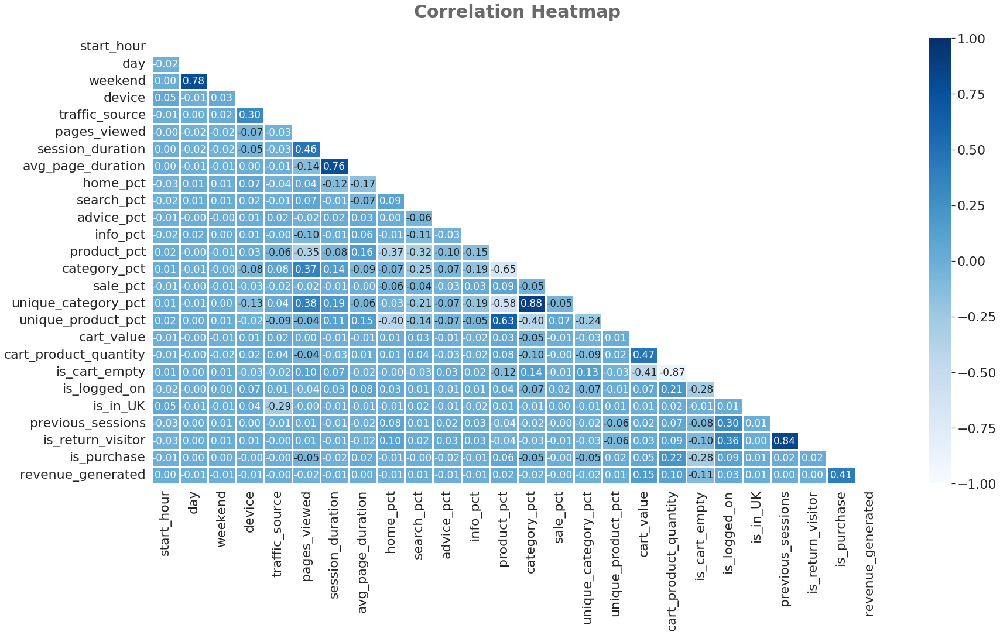

In [36]:
#Create Correlation Heatmap 

#compute pairwise correlation of columns, excluding nan values
corr_matrix = X.corr()

#set figure size
fig = plt.figure(figsize=[28,14])

#set aesthetic parameters
sns.set(style='white',font_scale=2)

#create the heatmap
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix,cmap='Blues',linewidth=3,linecolor='white',vmax = 1, vmin= -1,mask=mask, annot=True,fmt='0.2f', annot_kws={"size":17})

#add overall title

plt.title('Correlation Heatmap', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 30, y=1.05)
#show plot
plt.savefig('images/heatmap.png', bbox_inches='tight')


## Normalize Data

In [37]:
#Create a copy of the dataset and drop transaction columns 
X_normalized = X.copy()
X_normalized = X_normalized.drop(['is_purchase','revenue_generated'], axis=1)

X.head()

,start_hour,day,weekend,device,traffic_source,pages_viewed,session_duration,avg_page_duration,home_pct,search_pct,advice_pct,info_pct,product_pct,category_pct,sale_pct,unique_category_pct,unique_product_pct,cart_value,cart_product_quantity,is_cart_empty,is_logged_on,is_in_UK,previous_sessions,is_return_visitor,is_purchase,revenue_generated
0,16,3,0,0,0,2,43.522000,21.761000,0.0,0.0,0.0,50.0,50.000000,0.000000,0.0,0.0,100.0,0.00,0,1,0,1,0,0,0.0,0.0
1,7,4,0,0,1,2,66.922000,33.461000,0.0,0.0,0.0,0.0,50.000000,50.000000,0.0,100.0,100.0,0.00,0,1,0,1,0,0,0.0,0.0
2,13,3,0,0,2,4,208.541333,52.135333,25.0,25.0,0.0,0.0,0.000000,50.000000,0.0,100.0,0.0,0.00,0,1,0,0,0,0,0.0,0.0
3,22,3,0,0,0,3,138.324000,46.108000,0.0,0.0,0.0,0.0,33.333333,66.666667,0.0,100.0,100.0,0.00,0,1,0,1,0,0,0.0,0.0
4,10,6,1,2,1,2,71.942000,35.971000,0.0,0.0,0.0,0.0,100.000000,0.000000,0.0,0.0,100.0,41.99,1,0,0,1,0,0,0.0,0.0


In [38]:
X_normalized.describe()

,start_hour,day,weekend,device,traffic_source,pages_viewed,session_duration,avg_page_duration,home_pct,search_pct,advice_pct,info_pct,product_pct,category_pct,sale_pct,unique_category_pct,unique_product_pct,cart_value,cart_product_quantity,is_cart_empty,is_logged_on,is_in_UK,previous_sessions,is_return_visitor
count,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000,17585.000000
mean,14.609326,2.742622,0.230253,1.151095,0.858118,2.728234,110.530031,42.364791,5.028697,9.460721,1.098474,3.724765,56.538927,24.148415,4.004224,40.492397,85.580839,26.715727,0.155303,0.876031,0.044129,0.974922,0.008871,0.005914
std,4.987143,1.964296,0.421007,0.953227,0.615014,1.255113,79.908214,29.317461,13.401723,19.548517,7.266846,13.330563,34.508331,31.401442,14.254492,48.121502,34.408102,172.510863,0.472688,0.329556,0.205386,0.156367,0.137121,0.076678
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.562000,1.004000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,11.000000,1.000000,0.000000,0.000000,0.000000,2.000000,48.826000,20.621500,0.000000,0.000000,0.000000,0.000000,33.333333,0.000000,0.000000,0.000000,100.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000
50%,15.000000,3.000000,0.000000,2.000000,1.000000,2.000000,89.932000,34.788400,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.000000,0.000000,100.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000
75%,19.000000,4.000000,0.000000,2.000000,1.000000,3.000000,154.106000,56.866500,0.000000,0.000000,0.000000,0.000000,100.000000,50.000000,0.000000,100.000000,100.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000
max,23.000000,6.000000,1.000000,2.000000,3.000000,8.000000,421.081143,144.659000,80.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,6819.980000,6.000000,1.000000,1.000000,1.000000,7.000000,1.000000


In [39]:
#Normalize the variables with StandardScaler
scaler = StandardScaler()
scaler.fit(X_normalized)

X_normalized = scaler.transform(X_normalized)


## Dimensionality Reduction

In [40]:
# Employ PCA to find a subset of components, which explain the variance in the data.
pca = PCA()

# Fit PCA with our standardized data.
pca.fit(X_normalized)

# The attribute shows how much variance is explained by each of the eleven individual components.
pca.explained_variance_ratio_

array([1.31403666e-01, 1.01544498e-01, 8.44705301e-02, 7.66900403e-02,
       7.37172963e-02, 6.09419207e-02, 5.85894270e-02, 4.78598697e-02,
       4.56960253e-02, 4.33928649e-02, 4.00685084e-02, 3.93608118e-02,
       3.70220895e-02, 3.46238078e-02, 3.19918340e-02, 2.59352441e-02,
       2.22514901e-02, 1.72303482e-02, 9.16759582e-03, 6.60668223e-03,
       4.97180479e-03, 4.61677369e-03, 1.84687079e-03, 7.21449185e-33])

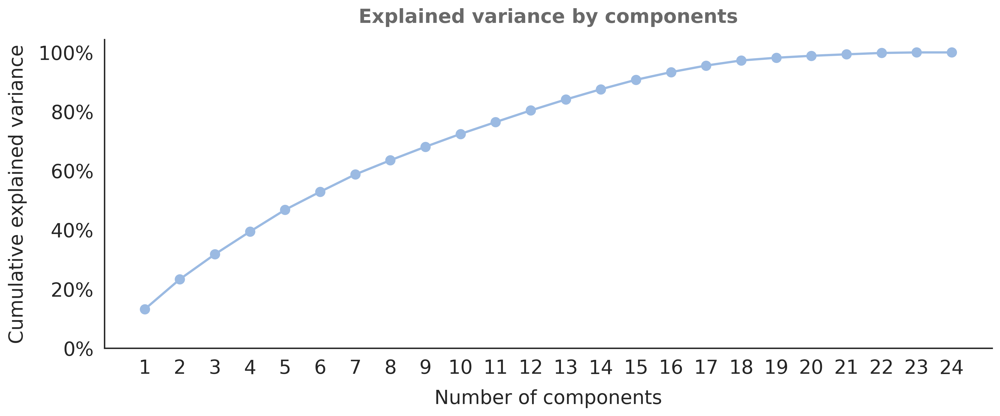

In [41]:
# Plot the cumulative variance explained by total number of components.
# On this graph we choose the subset of components we want to keep. 
# We want to keep around 90-95 % of the explained variance.

fig = plt.figure(figsize=(14,5), dpi=300)    

ax = fig.add_subplot(111)

lines = ax.plot(range(1,25), pca.explained_variance_ratio_.cumsum()*100, marker = 'o', color='#9BBAE2',linewidth = 2, ms = 8)
# plt.axhline(y=90, color='r', linestyle='--')
# plt.axhline(y=95, color='r', linestyle='--')

#Set aesthetic parameters
sns.set(style = 'white')
sns.despine()

plt.title('Explained variance by components', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 17, y=1.05)
plt.xlabel('Number of components', fontsize = 17, labelpad=10)
plt.xticks(np.arange(1,25,1))


plt.ylabel('Cumulative explained variance',fontsize = 17,  labelpad=10)
plt.yticks(np.arange(0,110, 20))
plt.tick_params(axis = 'both', which = 'major', labelsize = 17)
ax.yaxis.set_major_formatter(mtick.PercentFormatter())


plt.savefig('images/pca.png', bbox_inches='tight')


In [42]:
# We choose 15 components => 90 % explained variance
pca_90 = PCA(n_components = 15)


In [43]:
#Fit the data with the selected number of components
pca_90.fit(X_normalized)


PCA(n_components=15)

In [44]:
scores_pca_90 = pca_90.transform(X_normalized)


## K-means

### Inertia

In [23]:
# Perform K-means clustering. We consider 2 to 10 clusters, so our for loop runs 9 iterations.
# In addition we run the algortihm at many different starting points - k means plus plus. 
# And we set a random state for reproducibility.

#Compute inertias
inertias_kmeans_90 = []
for k in range(2,11):
    kmeans = KMeans(n_clusters = k, init = 'k-means++',random_state = 33)
    kmeans.fit(scores_pca_90)
    inertias_kmeans_90.append(kmeans.inertia_)
    
    

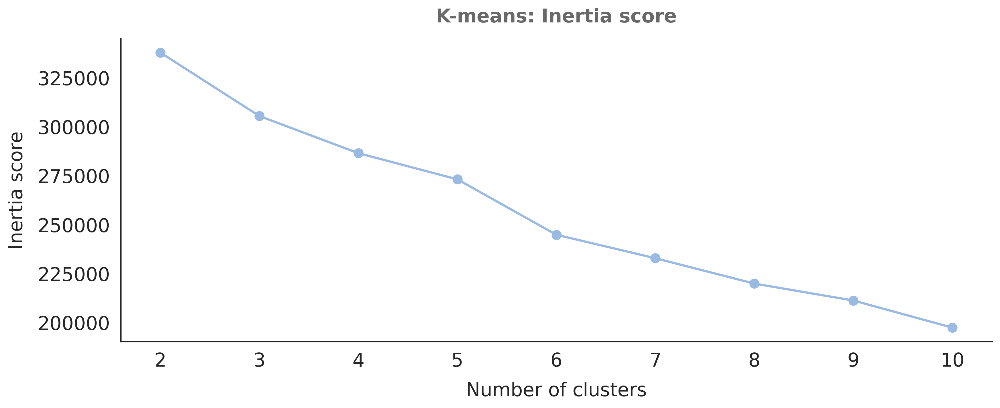

In [26]:
# Plot the inertia for the different number of clusters.
# From this plot we choose the number of clusters. 
# We look for a kink in the graphic, after which the descent of inertias isn't as pronounced.

plt.figure(figsize=(14,5), dpi =300)

ax = plt.plot(range(2,11), inertias_kmeans_90, color= "#9BBAE2",marker ="o", linewidth = 2, ms = 8)

#Set aesthetic parameters
sns.set(style = 'white')
sns.despine()

#Set labels, title, legend, axis parameters
plt.xlabel("Number of clusters", fontsize = 17, labelpad=10)
plt.ylabel('Inertia score', fontsize = 17, labelpad=10)
plt.title('K-means: Inertia score', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 17, y=1.05)
plt.tick_params(axis = 'both', which = 'major', labelsize = 17)

plt.savefig('images/inertias_kmeans_90.png', bbox_inches='tight')


There is an elbow at k=6

### Silhouette Score (Overall)

In [17]:
# Compute silhouette score for different values of k
sil_scores_kmeans_90 = []
for k in range(2,11):
    kmeans = KMeans(n_clusters = k, init = 'k-means++',random_state = 33)
    kmeans.fit(scores_pca_90)
    cluster_labels = kmeans.labels_
    sil_avg = silhouette_score(scores_pca_90, cluster_labels, metric='euclidean')
    sil_scores_kmeans_90.append(sil_avg)
    
print(sil_scores_kmeans_90)

[0.1431558185075881, 0.14972005736796853, 0.1332308198667473, 0.14512967236249993, 0.16116487826607273, 0.16543251621890007, 0.16397121054691746, 0.1563946856330727, 0.16131405090712828]


The silhouette score at k=6 is 0.1611648782660728

#### Graph

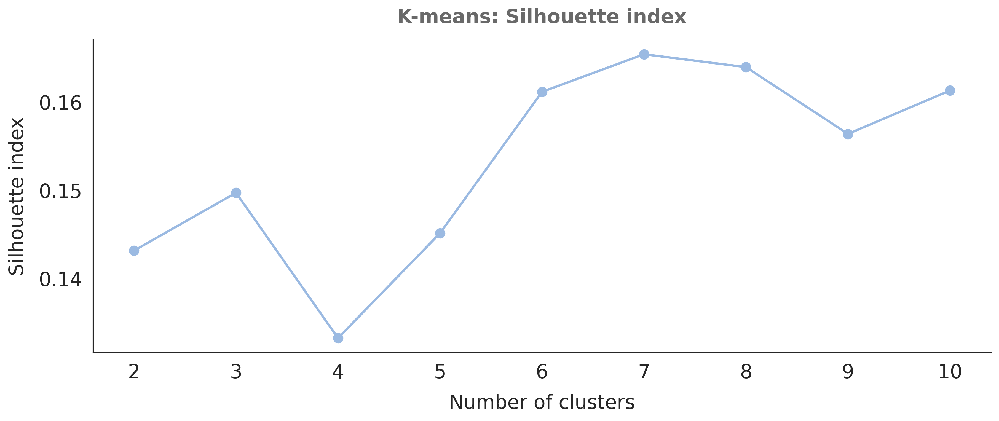

In [22]:
# Plot the silhouette score for different values of k
plt.figure(figsize=(14,5), dpi =300)

ax = plt.plot(range(2,11), sil_scores_kmeans_90, color= "#9BBAE2",marker ="o", linewidth = 2, ms = 8)

#Set aesthetic parameters
sns.set(style = 'white')
sns.despine()

#Set labels, title, legend, axis parameters
plt.xlabel("Number of clusters", fontsize = 17, labelpad=10)
plt.ylabel('Silhouette index', fontsize = 17, labelpad=10)
plt.title('K-means: Silhouette index', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 17, y=1.05)
plt.tick_params(axis = 'both', which = 'major', labelsize = 17)

plt.savefig('images/silhouette_kmeans_90.png', bbox_inches='tight')


### Silhouette Score (Clusters)

#### Graph

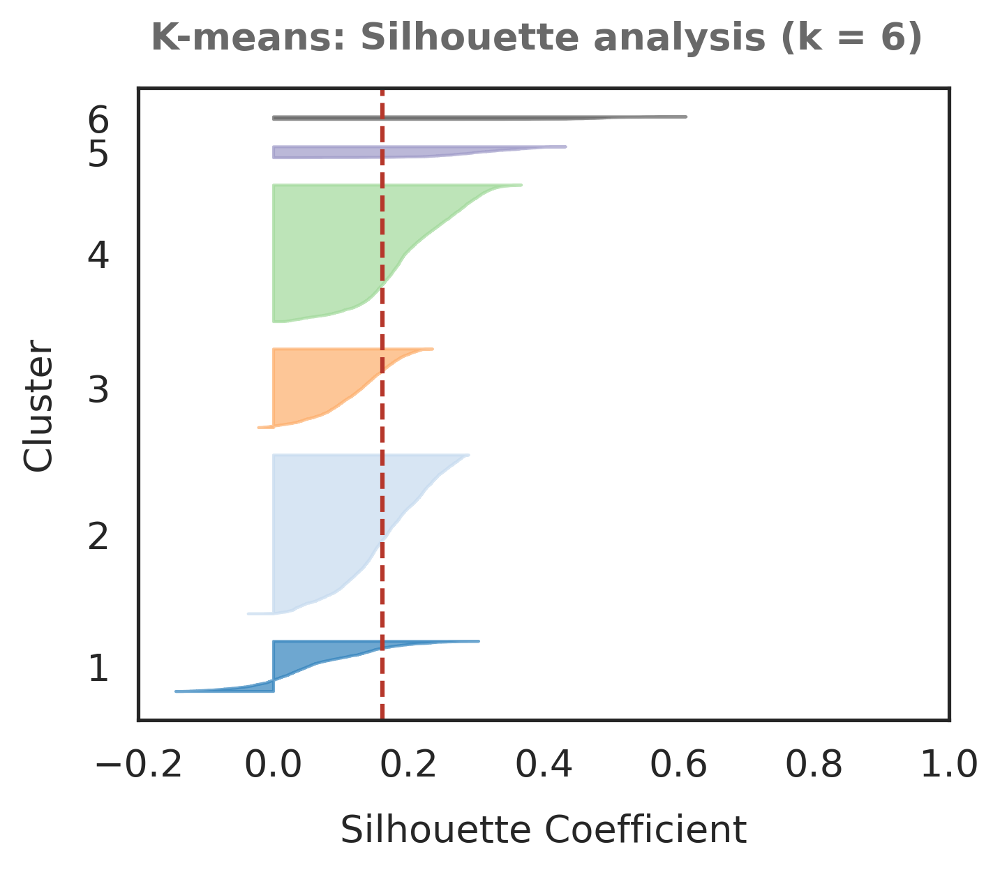

In [19]:
#Silhouette analysis visual graph. Dotted red line indicates silhouette score for the entire dataset

kmeans = KMeans(n_clusters = 6, init = 'k-means++',random_state = 22).fit(scores_pca_90)
y_pred = kmeans.labels_
silhouette_coefficients = silhouette_samples(scores_pca_90, y_pred)

title = 'K-means: Silhouette analysis (k = 6) ' 
k= 6
x_start = -0.2
get_silhouette_graph(k, silhouette_coefficients,0,1100,sil_scores_kmeans_90,title,x_start)

plt.savefig('images/silhouette_kmeans_clusters_90.png', bbox_inches='tight')


### Davies Bouldin Score


In [28]:
# Compute davies bouldin scores for different values of k
db_scores_kmeans_90 = []
for k in range(2,11):
    kmeans = KMeans(n_clusters=k, init = 'k-means++', random_state = 33)
    predictions = kmeans.fit_predict(scores_pca_90)
    db_avg = davies_bouldin_score(scores_pca_90, predictions)
    db_scores_kmeans_90.append(db_avg)

print(db_scores_kmeans_90)


[2.3834615002335795, 1.757019405872164, 1.8374035863681062, 1.973621915301909, 1.700055584274559, 1.5831337372457146, 1.4724149545176346, 1.5913275991419127, 1.5975332865294178]


The db score at k=6 is 1.7000555842745584

#### Graph


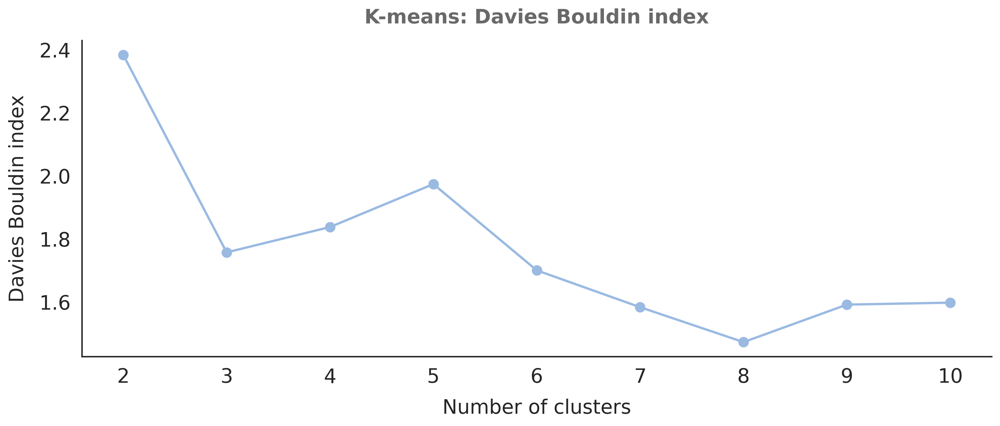

In [29]:
# Plot davies bouldin score for different values of k
plt.figure(figsize=(14,5), dpi =300)

ax = plt.plot(range(2,11), db_scores_kmeans_90, color= "#9BBAE2",marker ="o",linewidth = 2, ms = 8)

#Set aesthetic parameters
sns.set(style = 'white')
sns.despine()

#Set labels, title, legend, axis parameters
plt.xlabel("Number of clusters", fontsize = 17, labelpad=10)
plt.ylabel('Davies Bouldin index', fontsize = 17, labelpad=10)
plt.title('K-means: Davies Bouldin index', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 17, y=1.05)
plt.tick_params(axis = 'both', which = 'major', labelsize = 17)

plt.savefig('images/db_kmeans_90.png', bbox_inches='tight')


### Calinski Harabasz score

In [30]:
# Compute calinski harabasz scores for different values of k
ch_scores_kmeans_90 = []
for k in range(2,11):
    kmeans = KMeans(n_clusters=k, init = 'k-means++', random_state = 33)
    kmeans.fit(scores_pca_90)
    cluster_labels = kmeans.labels_
    ch_avg = calinski_harabasz_score(scores_pca_90, cluster_labels)
    ch_scores_kmeans_90.append(ch_avg)
    
print(ch_scores_kmeans_90)

[2349.091318129909, 2230.86405893078, 1973.570728392184, 1767.120497701032, 1983.2770471402876, 1888.039218927276, 1861.47187230188, 1785.0799133972034, 1834.919737430921]


The ch score at k=6 is 1983.2770471402887

#### Graph


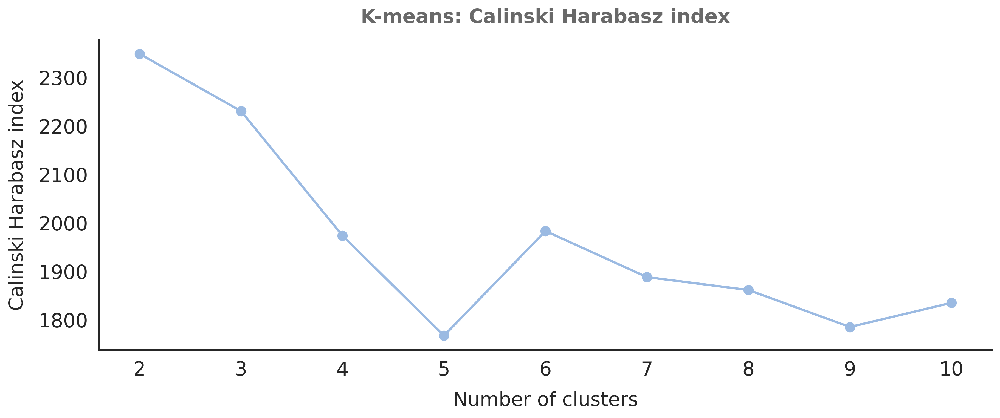

In [31]:
# Plot calinski harabasz scores for different values of k

plt.figure(figsize=(14,5), dpi =300)

ax = plt.plot(range(2,11), ch_scores_kmeans_90, color= "#9BBAE2",marker ="o",linewidth = 2, ms = 8)

#Set aesthetic parameters
sns.set(style = 'white')
sns.despine()

#Set labels, title, legend, axis parameters
plt.xlabel("Number of clusters", fontsize = 17, labelpad=10)
plt.ylabel('Calinski Harabasz index', fontsize = 17, labelpad=10)
plt.title('K-means: Calinski Harabasz index', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 17, y=1.05)
plt.tick_params(axis = 'both', which = 'major', labelsize = 17)

plt.savefig('images/ch_kmeans_90.png', bbox_inches='tight')


## K-medoids

### Inertia

In [16]:
# Perform K-medoids clustering. We consider 2 to 10 clusters, so our for loop runs 9 iterations.
# In addition we run the algortihm at many different starting points - k medoids plus plus. 
# And we set a random state for reproducibility.

#compute inertias
inertias_kmedoids_90 = []
for k in range(2,11):
    kmedoids = KMedoids(n_clusters = k, init = 'k-medoids++',random_state = 69)
    kmedoids.fit(scores_pca_90)
    inertias_kmedoids_90.append(kmedoids.inertia_)
    
    

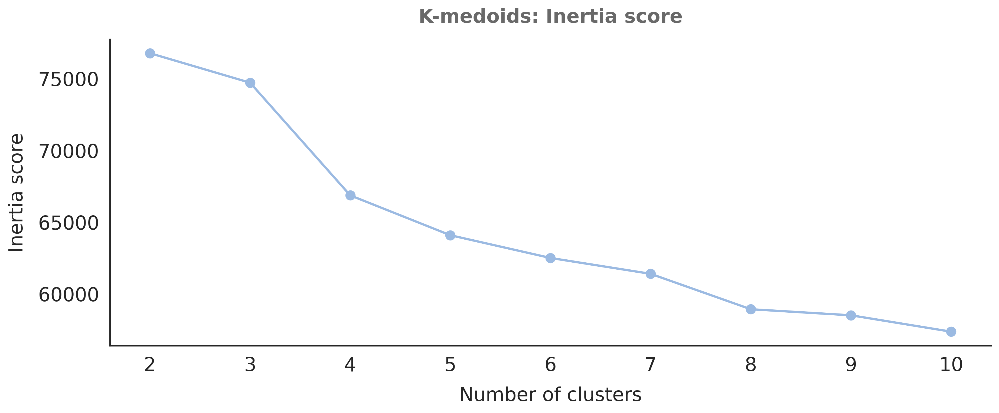

In [17]:
# Plot the inertia for the different number of clusters.
# From this plot we choose the number of clusters. 
# We look for a kink in the graphic, after which the descent of inertias isn't as pronounced.

plt.figure(figsize=(14,5), dpi =300)

ax = plt.plot(range(2,11), inertias_kmedoids_90, color= "#9BBAE2",marker ="o",linewidth = 2, ms = 8)

#Set aesthetic parameters
sns.set(style = 'white')
sns.despine()

#Set labels, title, legend, axis parameters
plt.xlabel("Number of clusters", fontsize = 17, labelpad=10)
plt.ylabel('Inertia score', fontsize = 17, labelpad=10)
plt.title('K-medoids: Inertia score', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 17, y=1.05)
plt.tick_params(axis = 'both', which = 'major', labelsize = 17)


plt.savefig('images/inertias_kmedoids_90.png', bbox_inches='tight')


There is an elbow at k=4 and k=8

### Silhouette Score (Overall)

In [18]:
# Compute silhouette score for different values of k
sil_scores_kmedoids_90 = []
for k in range(2,11):
    kmedoids = KMedoids(n_clusters = k, init = 'k-medoids++', random_state = 69)
    kmedoids.fit(scores_pca_90)
    cluster_labels = kmedoids.labels_
    sil_avg = silhouette_score(scores_pca_90, cluster_labels, metric='euclidean')
    sil_scores_kmedoids_90.append(sil_avg)
    
print(sil_scores_kmedoids_90)

[0.3438245619682396, 0.09023206748849268, 0.13521214999278489, 0.16218687354427794, 0.15270028759921184, 0.12016946700182263, 0.1565292798761748, 0.15736680761871888, 0.13562925857445268]


The silhouette score for k =4 is 0.13521214999278486 and for k = 8 is 0.1565292798761748

#### Graph 

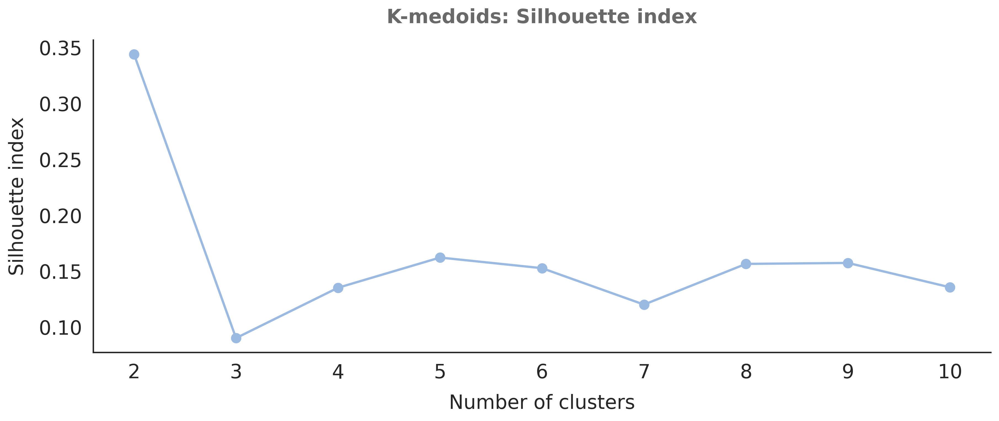

In [19]:
# Plot the silhouette score for different values of k

plt.figure(figsize=(14,5), dpi =300)

ax = plt.plot(range(2,11), sil_scores_kmedoids_90, color= "#9BBAE2",marker ="o",linewidth = 2, ms = 8)

#Set aesthetic parameters
sns.set(style = 'white')
sns.despine()

#Set labels, title, legend, axis parameters
plt.xlabel("Number of clusters", fontsize = 17, labelpad=10)
plt.ylabel('Silhouette index', fontsize = 17, labelpad=10)
plt.title('K-medoids: Silhouette index', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 17, y=1.05)
plt.tick_params(axis = 'both', which = 'major', labelsize = 17)

plt.savefig('images/silhouette_kmedoids_90.png', bbox_inches='tight')


### Silhouette Score (Clusters)

#### Graph

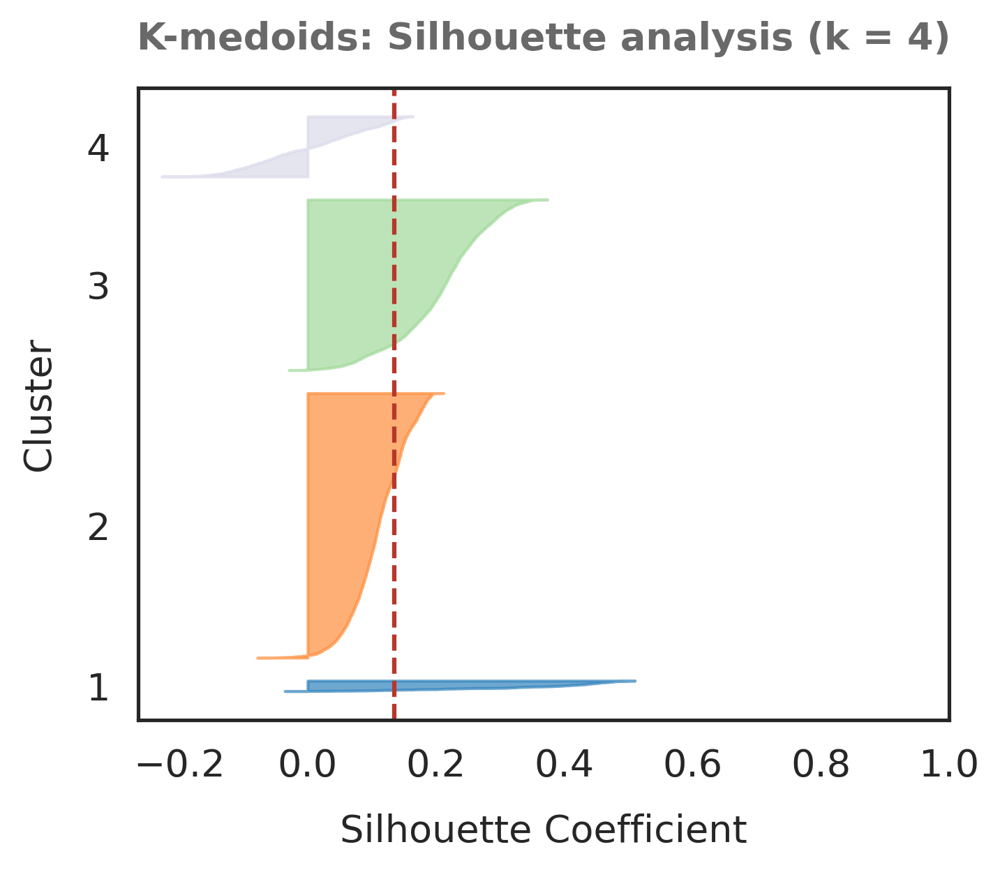

In [27]:
#Silhouette analysis visual graph. Dotted red line indicates silhouette score for the entire dataset

kmedoids = KMedoids(n_clusters = 4, init = 'k-medoids++', random_state = 69).fit(scores_pca_90)
y_pred = kmedoids.labels_
silhouette_coefficients = silhouette_samples(scores_pca_90, y_pred)

title = 'K-medoids: Silhouette analysis (k = 4)' 
k = 4
x_start = -0.2

get_silhouette_graph(k, silhouette_coefficients,0,800,sil_scores_kmedoids_90,title,x_start)

plt.savefig('images/silhouette_kmedoids_clusters_90.png', bbox_inches='tight')


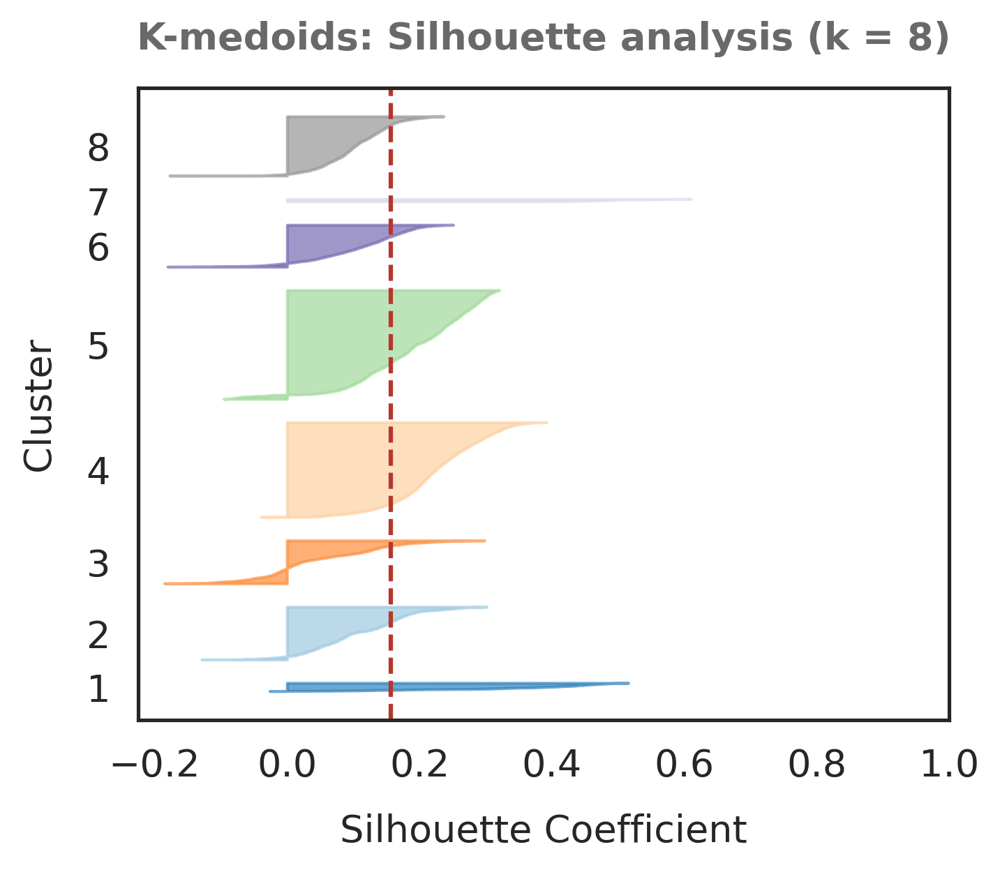

In [26]:
#Silhouette analysis visual graph. Dotted red line indicates silhouette score for the entire dataset

kmedoids = KMedoids(n_clusters = 8, init = 'k-medoids++', random_state = 69).fit(scores_pca_90)
y_pred = kmedoids.labels_
silhouette_coefficients = silhouette_samples(scores_pca_90, y_pred)

title = 'K-medoids: Silhouette analysis (k = 8)' 
k = 8
x_start = -0.2

get_silhouette_graph(k, silhouette_coefficients,0,1000,sil_scores_kmedoids_90,title,x_start)

plt.savefig('images/silhouette_kmedoids_clusters_90_B.png', bbox_inches='tight')


### Davies Bouldin Score


In [22]:
# Compute davies bouldin scores for different values of k
db_scores_kmedoids_90 = []
for k in range(2,11):
    kmedoids = KMedoids(n_clusters = k,init = 'k-medoids++', random_state = 69).fit(scores_pca_90)
    predictions = kmedoids.fit_predict(scores_pca_90)
    db_avg = davies_bouldin_score(scores_pca_90, predictions)
    db_scores_kmedoids_90.append(db_avg)

print(db_scores_kmedoids_90)

[1.2328404437202785, 2.707005293017792, 2.0280733679822047, 1.7621806706140561, 1.8328056422722299, 2.08752466374044, 1.6269096628240174, 1.7851315576432034, 1.8069258520146156]


The db score for k = 4 is 2.0280733679822047 and for k = 8 is 1.6269096628240174 

#### Graph

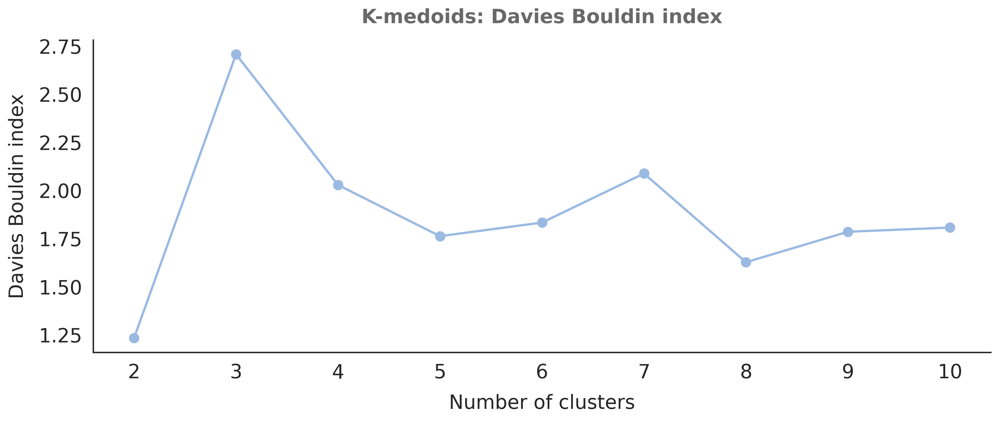

In [23]:
# Plot davies bouldin score for different values of k

plt.figure(figsize=(14,5), dpi =300)

ax = plt.plot(range(2,11), db_scores_kmedoids_90, color= "#9BBAE2",marker ="o",linewidth = 2, ms = 8)

#Set aesthetic parameters
sns.set(style = 'white')
sns.despine()

#Set labels, title, legend, axis parameters
plt.xlabel("Number of clusters", fontsize = 17, labelpad=10)
plt.ylabel('Davies Bouldin index', fontsize = 17, labelpad=10)
plt.title('K-medoids: Davies Bouldin index', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 17, y=1.05)
plt.tick_params(axis = 'both', which = 'major', labelsize = 17)

plt.savefig('images/db_kmedoids_90.png', bbox_inches='tight')


### Calinski Harabasz score

In [24]:
# Compute calinski harabasz scores for different values of k
ch_scores_kmedoids_90 = []
for k in range(2,11):
    kmedoids = KMedoids(n_clusters = k, init = 'k-medoids++', random_state = 33)
    kmedoids.fit(scores_pca_90)
    cluster_labels = kmedoids.labels_
    ch_avg = calinski_harabasz_score(scores_pca_90, cluster_labels)
    ch_scores_kmedoids_90.append(ch_avg)
    
print(ch_scores_kmedoids_90)

[2311.8973919615396, 1211.772199865687, 1476.9671794804224, 1634.0104226970718, 1448.5495760390995, 1335.6535044196469, 1602.0621293895485, 1493.368931125342, 1717.282893244942]


The ch score for k=4  is 1476.9671794804226 and for k = 8 is 1602.0621293895485

#### Graph

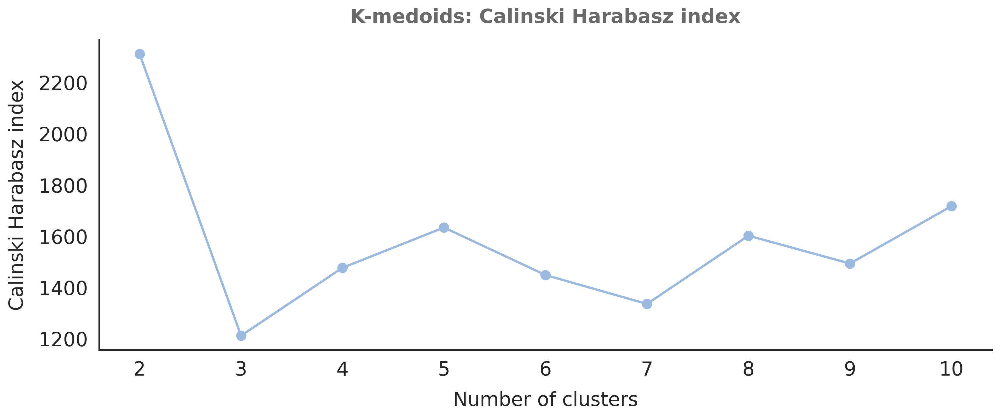

In [25]:
# Plot calinski harabasz scores for different values of k

plt.figure(figsize=(14,5), dpi =300)

ax = plt.plot(range(2,11), ch_scores_kmedoids_90, color= "#9BBAE2",marker ="o",linewidth = 2, ms = 8)

#Set aesthetic parameters
sns.set(style = 'white')
sns.despine()

#Set labels, title, legend, axis parameters
plt.xlabel("Number of clusters", fontsize = 17, labelpad=10)
plt.ylabel('Calinski Harabasz index', fontsize = 17, labelpad=10)
plt.title('K-medoids: Calinski Harabasz index', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 17, y=1.05)
plt.tick_params(axis = 'both', which = 'major', labelsize = 17)

plt.savefig('images/ch_kmedoids_90.png', bbox_inches='tight')


# Ward Agglomerative Clustering 

In [38]:
# Perform Hierarchical Clustering. The results are returned as a linkage matrix. 
hier_clust_ward = linkage(scores_pca_90, method = 'ward', metric='euclidean')


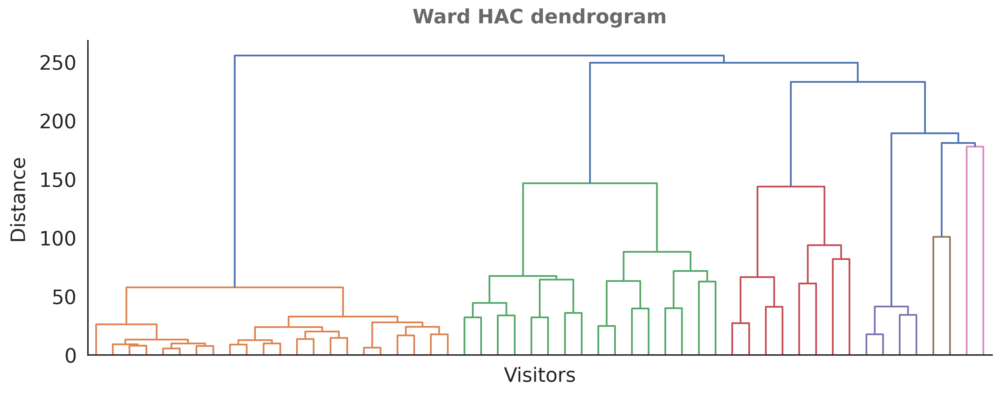

In [203]:
# We plot the results from the Hierarchical Clustering using a Dendrogram. 
# We truncate the dendrogram for better readability. The level p shows only the last p merged clusters
plt.figure(figsize = (14,5), dpi =300)
plt.title('Ward HAC dendrogram', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 17, y=1.05)
plt.xlabel('Visitors', fontsize = 17,labelpad=10)
plt.ylabel('Distance', fontsize = 17,labelpad=10)

#Set aesthetic parameters
sns.set(style = 'white')
sns.despine()

plt.tick_params(axis = 'both', which = 'major', labelsize = 17)

dendrogram(hier_clust_ward,
           truncate_mode = 'level', 
           p = 5, 
           show_leaf_counts = False, 
           no_labels = True)

plt.savefig('images/ward_dendrogram_90.png', bbox_inches='tight')



The dendrogram suggests k = 4

### Silhouette Score (Overall)

In [28]:
# Compute silhouette score for different values of k
sil_scores_ward_90 = []
for k in range(2,11):
    agglomerative = AgglomerativeClustering(n_clusters=k, linkage='ward')
    agglomerative.fit(scores_pca_90)
    cluster_labels = agglomerative.labels_
    sil_avg = silhouette_score(scores_pca_90, cluster_labels, metric='euclidean')
    sil_scores_ward_90.append(sil_avg)
print(sil_scores_ward_90)

[0.690297105713432, 0.0853448770533298, 0.10996232762621146, 0.12600608318758505, 0.1213044351021416, 0.13744546042971598, 0.1572107386666072, 0.15334376320028084, 0.15730967502497106]


The silhouette score for k=4  is 0.10996232762621143

#### Graph

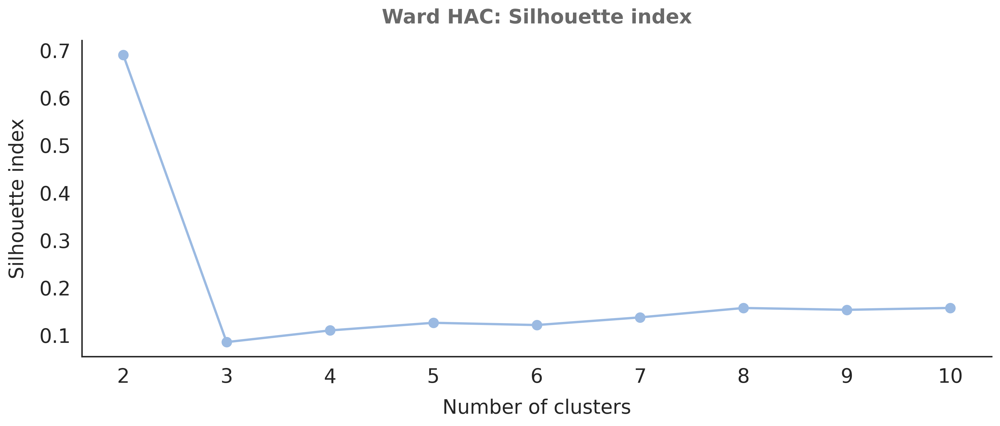

In [29]:
# Plot the silhouette score for different values of k

plt.figure(figsize=(14,5), dpi =300)

ax = plt.plot(range(2,11), sil_scores_ward_90, color= "#9BBAE2",marker ="o",linewidth = 2, ms = 8)

#Set aesthetic parameters
sns.set(style = 'white')
sns.despine()

#Set labels, title, legend, axis parameters
plt.xlabel("Number of clusters", fontsize = 17, labelpad=10)
plt.ylabel('Silhouette index', fontsize = 17, labelpad=10)
plt.title('Ward HAC: Silhouette index', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 17, y=1.05)
plt.tick_params(axis = 'both', which = 'major', labelsize = 17)

plt.savefig('images/silhouette_ward_90.png', bbox_inches='tight')


### Silhouette Score (Clusters)

#### Graph

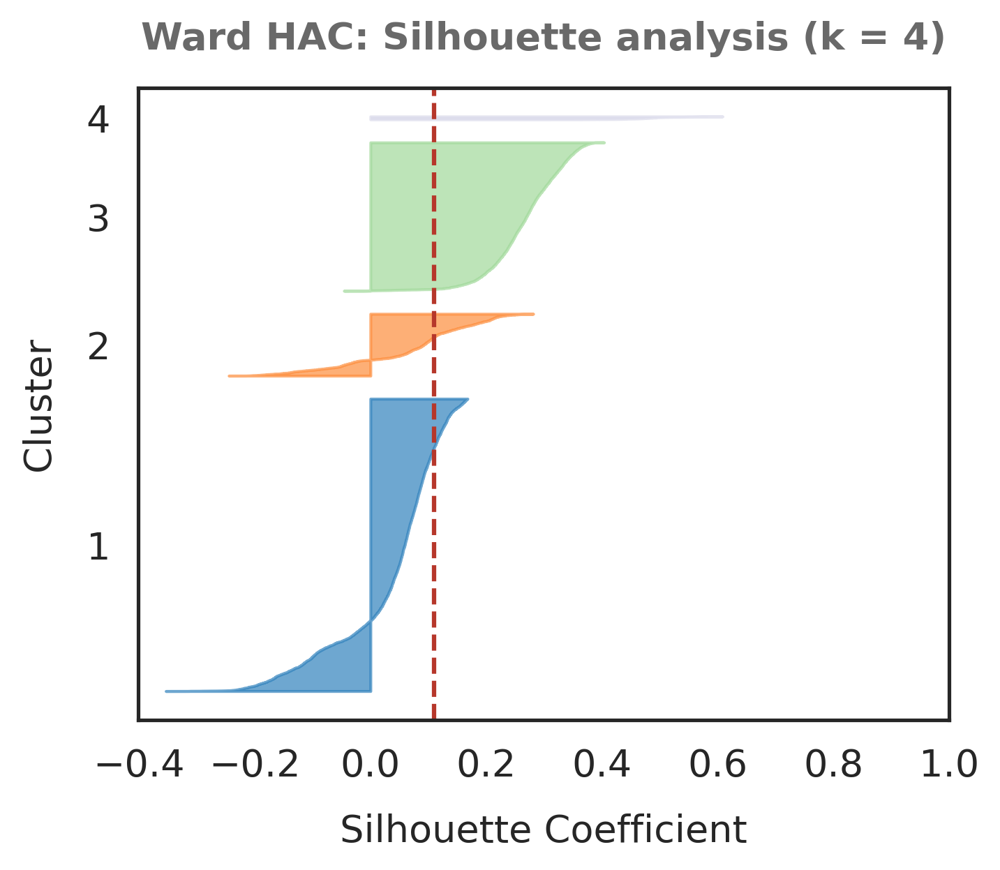

In [38]:
#Silhouette analysis visual graph. Dotted red line indicates silhouette score for the entire dataset

agglomerative = AgglomerativeClustering(n_clusters=4, linkage='ward')
agglomerative.fit(scores_pca_90)
y_pred = agglomerative.labels_
silhouette_coefficients = silhouette_samples(scores_pca_90, y_pred)

title = 'Ward HAC: Silhouette analysis (k = 4)'  
k = 4
x_start = -0.4
get_silhouette_graph(k, silhouette_coefficients,0,800,sil_scores_ward_90,title,x_start)

plt.savefig('images/silhouette_ward_clusters_90.png', bbox_inches='tight')


### Davies Bouldin Score


In [31]:
# Compute davies bouldin scores for different values of k
db_scores_ward_90 = []
for k in range(2,11):
    agglomerative = AgglomerativeClustering(n_clusters=k, linkage='ward')
    agglomerative.fit(scores_pca_90)
    y_pred = agglomerative.labels_
    db_avg = davies_bouldin_score(scores_pca_90, y_pred)
    db_scores_ward_90.append(db_avg)

print(db_scores_ward_90)


[0.6172994069436745, 1.8735663033542582, 1.904811701636402, 1.71308002095872, 1.7254573421927029, 1.5950777819879476, 1.5431162141697377, 1.5388453210593953, 1.5654865874594115]


The db score for k=4  is 1.9048117016364023

#### Graph

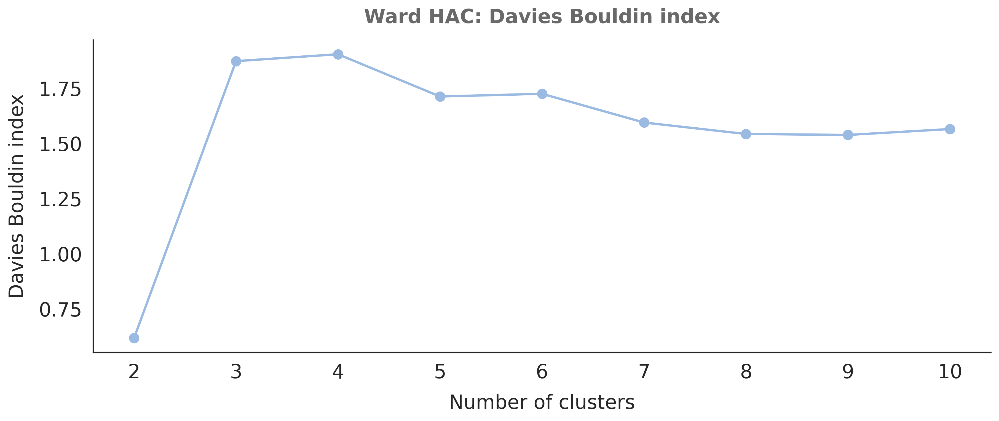

In [32]:
# Plot davies bouldin score for different values of k

plt.figure(figsize=(14,5), dpi =300)

ax = plt.plot(range(2,11), db_scores_ward_90, color= "#9BBAE2",marker ="o",linewidth = 2, ms = 8)

#Set aesthetic parameters
sns.set(style = 'white')
sns.despine()

#Set labels, title, legend, axis parameters
plt.xlabel("Number of clusters", fontsize = 17, labelpad=10)
plt.ylabel('Davies Bouldin index', fontsize = 17, labelpad=10)
plt.title('Ward HAC: Davies Bouldin index', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 17, y=1.05)
plt.tick_params(axis = 'both', which = 'major', labelsize = 17)

plt.savefig('images/db_ward_90.png', bbox_inches='tight')


### Calinski Harabasz score

In [33]:
# Compute calinski harabasz scores for different values of k
ch_scores_ward_90 = []
for k in range(2,11):
    agglomerative = AgglomerativeClustering(n_clusters=k, linkage='ward')
    agglomerative.fit(scores_pca_90)
    cluster_labels = agglomerative.labels_
    ch_avg = calinski_harabasz_score(scores_pca_90, cluster_labels)
    ch_scores_ward_90.append(ch_avg)
    
print(ch_scores_ward_90)

[1638.5767883616152, 1755.2988571674434, 1823.754940939607, 1743.5818326604146, 1706.08475093456, 1705.9266958124424, 1721.879461652532, 1695.8177668090354, 1688.356181849304]


The ch score for k=4  is 1823.7549409396065

#### Graph

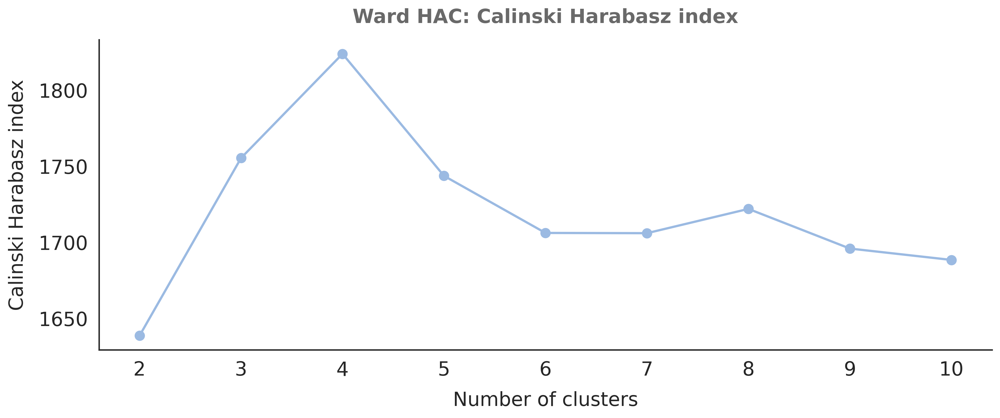

In [34]:
# Plot calinski harabasz scores for different values of k

plt.figure(figsize=(14,5), dpi =300)

ax = plt.plot(range(2,11), ch_scores_ward_90, color= "#9BBAE2",marker ="o",linewidth = 2, ms = 8)

#Set aesthetic parameters
sns.set(style = 'white')
sns.despine()

#Set labels, title, legend, axis parameters
plt.xlabel("Number of clusters", fontsize = 17, labelpad=10)
plt.ylabel('Calinski Harabasz index', fontsize = 17, labelpad=10)
plt.title('Ward HAC: Calinski Harabasz index', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 17, y=1.05)
plt.tick_params(axis = 'both', which = 'major', labelsize = 17)

plt.savefig('images/ch_ward_90.png', bbox_inches='tight')


# Average HAC 

In [35]:
# Perform Hierarchical Clustering. The results are returned as a linkage matrix. 
hier_clust_avg = linkage(scores_pca_90, method = 'average', metric='euclidean')


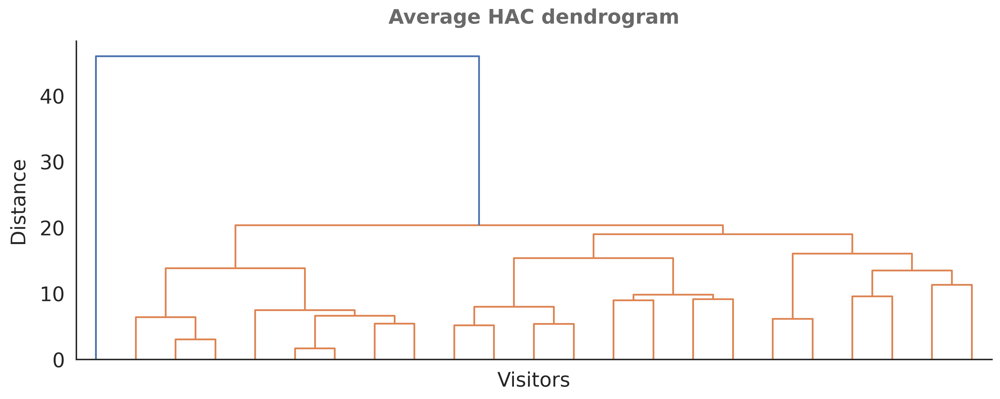

In [202]:
# We plot the results from the Hierarchical Clustering using a Dendrogram. 
# We truncate the dendrogram for better readability. The level p shows only the last p merged clusters
plt.figure(figsize = (14,5), dpi =300)
plt.title('Average HAC dendrogram', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 17, y=1.05)
plt.xlabel('Visitors', fontsize = 17,labelpad=10)
plt.ylabel('Distance', fontsize = 17,labelpad=10)

#Set aesthetic parameters
sns.set(style = 'white')
sns.despine()

plt.tick_params(axis = 'both', which = 'major', labelsize = 17)

dendrogram(hier_clust_avg,
           truncate_mode = 'level', 
           p = 5, 
           show_leaf_counts = False, 
           no_labels = True)

plt.savefig('images/average_dendrogram_90.png', bbox_inches='tight')


The dendrogram suggests k = 2

### Silhouette Score (Overall)

In [36]:
# Compute silhouette score for different values of k
sil_scores_avg_90 = []
for k in range(2,11):
    agglomerative = AgglomerativeClustering(n_clusters=k, linkage='average')
    agglomerative.fit(scores_pca_90)
    cluster_labels = agglomerative.labels_
    sil_avg = silhouette_score(scores_pca_90, cluster_labels, metric='euclidean')
    sil_scores_avg_90.append(sil_avg)
print(sil_scores_avg_90)

[0.8662100477332283, 0.6993849851195671, 0.6828042354476062, 0.6810881502174683, 0.6095809977975464, 0.6043834389529917, 0.6042125121020878, 0.6040417401981113, 0.6038672056479777]


The silhouette score for k=2  is 0.8662100477332283

#### Graph

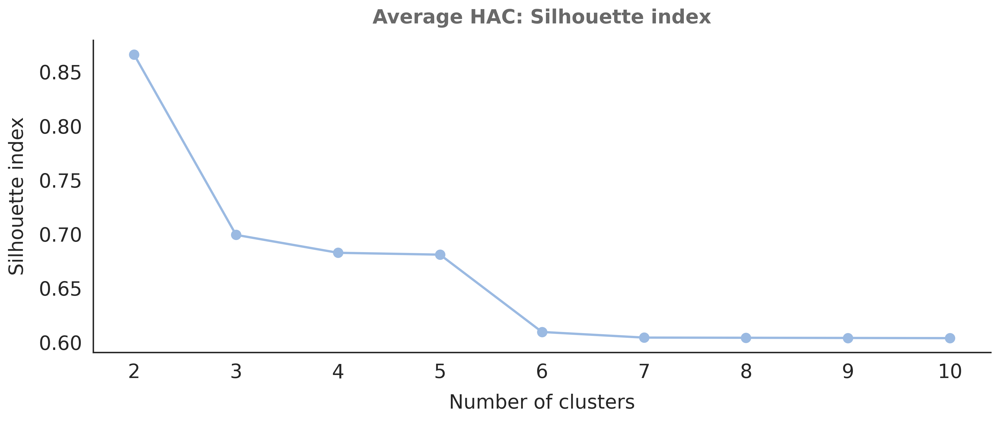

In [37]:
# Plot the silhouette score for different values of k

plt.figure(figsize=(14,5), dpi =300)

ax = plt.plot(range(2,11), sil_scores_avg_90, color= "#9BBAE2",marker ="o",linewidth = 2, ms = 8)

#Set aesthetic parameters
sns.set(style = 'white')
sns.despine()

#Set labels, title, legend, axis parameters
plt.xlabel("Number of clusters", fontsize = 17, labelpad=10)
plt.ylabel('Silhouette index', fontsize = 17, labelpad=10)
plt.title('Average HAC: Silhouette index', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 17, y=1.05)
plt.tick_params(axis = 'both', which = 'major', labelsize = 17)

plt.savefig('images/silhouette_avg_90.png', bbox_inches='tight')


### Silhouette Score (Clusters)

#### Graph

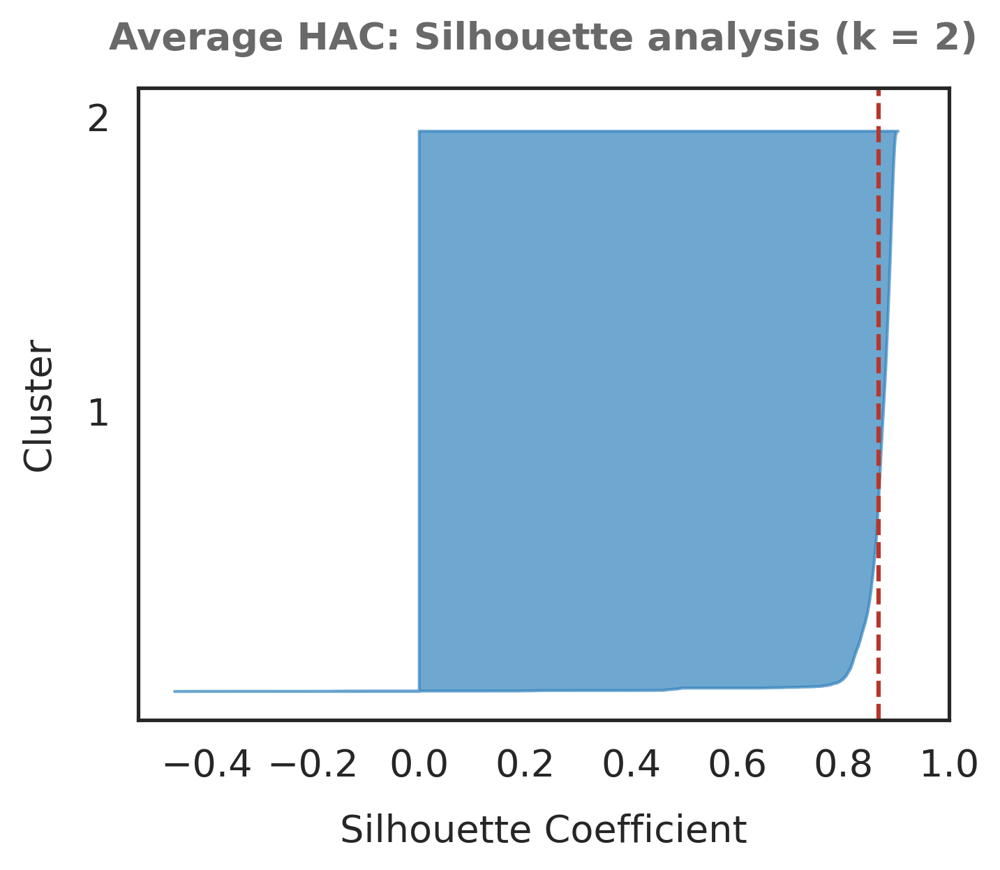

In [39]:
#Silhouette analysis visual graph. Dotted red line indicates silhouette score for the entire dataset

agglomerative = AgglomerativeClustering(n_clusters=2, linkage='average')
agglomerative.fit(scores_pca_90)
y_pred = agglomerative.labels_
silhouette_coefficients = silhouette_samples(scores_pca_90, y_pred)

title = 'Average HAC: Silhouette analysis (k = 2)' 
k = 2
x_start = -0.4

get_silhouette_graph(k, silhouette_coefficients,0,450,sil_scores_avg_90,title,x_start)

plt.savefig('images/silhouette_avg_clusters_90.png', bbox_inches='tight')


### Davies Bouldin Score


In [40]:
# Compute davies bouldin scores for different values of k
db_scores_avg_90 = []
for k in range(2,11):
    agglomerative = AgglomerativeClustering(n_clusters=k, linkage='average')
    agglomerative.fit(scores_pca_90)
    y_pred = agglomerative.labels_
    db_avg = davies_bouldin_score(scores_pca_90, y_pred)
    db_scores_avg_90.append(db_avg)

print(db_scores_avg_90)    


[0.09281546525775997, 0.42647080678654065, 0.5026555741392106, 0.5417758488295374, 0.5475147121987815, 0.5482209730648495, 0.6713218645940324, 0.6869675014116772, 0.6579284342324005]


The db score for k=2  is 0.09281546525776

#### Graph

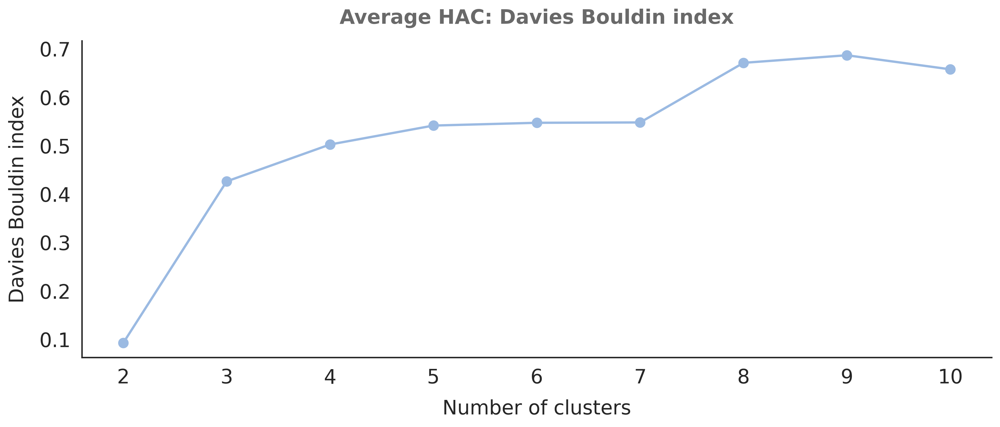

In [41]:
# Plot davies bouldin score for different values of k

plt.figure(figsize=(14, 5), dpi =300)

ax = plt.plot(range(2,11), db_scores_avg_90, color= "#9BBAE2",marker ="o",linewidth = 2, ms = 8)

#Set aesthetic parameters
sns.set(style = 'white')
sns.despine()

#Set labels, title, legend, axis parameters
plt.xlabel("Number of clusters", fontsize = 17, labelpad=10)
plt.ylabel('Davies Bouldin index', fontsize = 17, labelpad=10)
plt.title('Average HAC: Davies Bouldin index', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 17, y=1.05)
plt.tick_params(axis = 'both', which = 'major', labelsize = 17)

plt.savefig('images/db_avg_90.png', bbox_inches='tight')


### Calinski Harabasz score

In [42]:
# Compute calinski harabasz scores for different values of k
ch_scores_avg_90 = []
for k in range(2,11):
    agglomerative = AgglomerativeClustering(n_clusters=k, linkage='average')
    agglomerative.fit(scores_pca_90)
    cluster_labels = agglomerative.labels_
    ch_avg = calinski_harabasz_score(scores_pca_90, cluster_labels)
    ch_scores_avg_90.append(ch_avg)
    
print(ch_scores_avg_90)

[96.68190845282089, 136.15716075714363, 631.4398417609441, 479.20636097225986, 408.3881546848409, 343.638822009198, 306.0027953072797, 269.13970084089874, 239.73038905730175]


The ch score for k=2  is 96.68190845282079

#### Graph

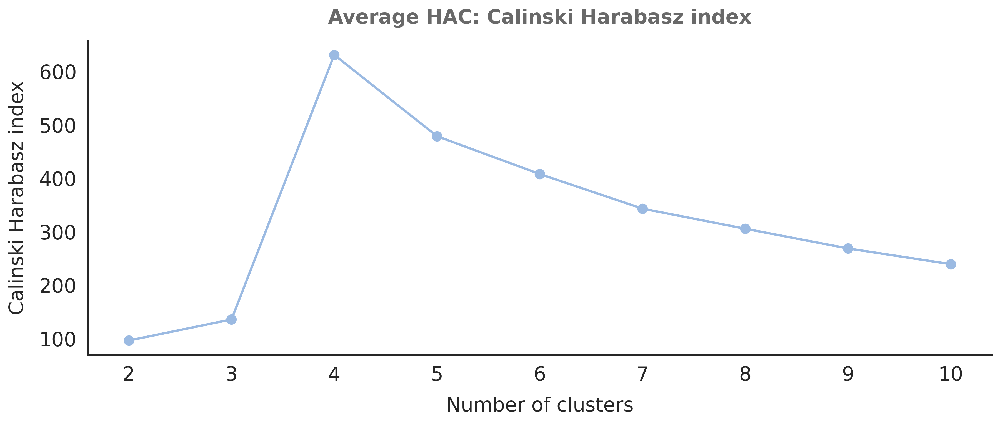

In [43]:
# Plot calinski harabasz scores for different values of k

plt.figure(figsize=(14, 5), dpi =300)

ax = plt.plot(range(2,11), ch_scores_avg_90, color= "#9BBAE2",marker ="o",linewidth = 2, ms = 8)

#Set aesthetic parameters
sns.set(style = 'white')
sns.despine()

#Set labels, title, legend, axis parameters
plt.xlabel("Number of clusters", fontsize = 17, labelpad=10)
plt.ylabel('Calinski Harabasz index', fontsize = 17, labelpad=10)
plt.title('Average HAC: Calinski Harabasz index', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 17, y=1.05)
plt.tick_params(axis = 'both', which = 'major', labelsize = 17)

plt.savefig('images/ch_avg_90.png', bbox_inches='tight')


## Visualise Clusters

In [45]:
# Store the results of the algorithms with the optimal number of clusters
kmeans = KMeans(n_clusters=6, init = 'k-means++', random_state = 33).fit(scores_pca_90)
kmedoids = KMedoids(n_clusters = 4, init = 'k-medoids++',random_state = 69).fit(scores_pca_90)
kmedoidsB = KMedoids(n_clusters = 8, init = 'k-medoids++',random_state = 69).fit(scores_pca_90)
avg_agglomerative = AgglomerativeClustering(n_clusters=2, linkage='average').fit(scores_pca_90)
ward_agglomerative = AgglomerativeClustering(n_clusters=4, linkage='ward').fit(scores_pca_90)

#### 2D Visualisation

In [67]:
# We reduce the dimensionality of the dataset to two components to visualise the clusters in 2D 
pca = PCA(n_components = 2)

#Fit the model the our data with the selected number of components. In our case three.
pca.fit(X_normalized)

scores_pca_2 = pca.transform(X_normalized)

In [117]:
#Transforming the array to a dataframe
df_pca = pd.DataFrame(data = scores_pca_2,
                      columns = ["Component 1",
                                 "Component 2"])

#Calculatixng explained variance ratio per principal component
pca.explained_variance_ratio_.round(5)


array([0.1314 , 0.10154])

In [118]:
df_pca['Segment K-means'] = kmeans.labels_ + 1
df_pca['Segment K-medoids'] = kmedoids.labels_ + 1
df_pca['Segment K-medoids B'] = kmedoidsB.labels_ + 1
df_pca['Segment Ward'] = ward_agglomerative.labels_ + 1
df_pca['Segment Avg'] = avg_agglomerative.labels_ + 1


In [114]:
df_pca.head()

,Component 1,Component 2,Segment K-means,Segment K-medoids,Segment K-medoids B,Segment Ward,Segment Avg
0,0.997545,-0.751590,4,2,5,1,1
1,-0.979790,-0.419040,2,3,4,3,1
2,-3.540773,0.974699,1,4,6,1,1
3,-1.700781,-0.605487,2,3,4,3,1
4,2.686981,1.285055,3,2,3,2,1


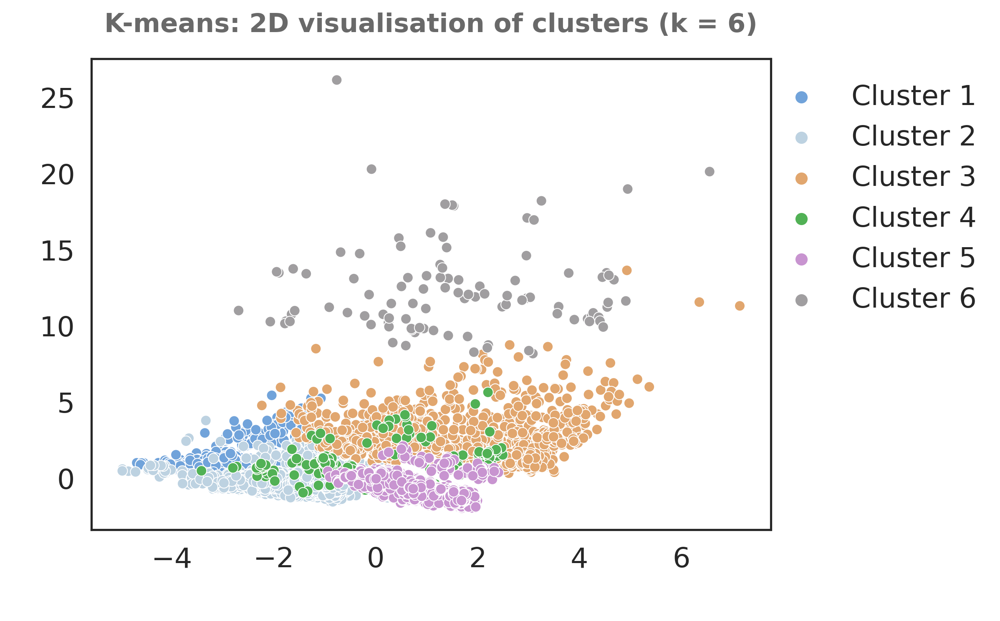

In [96]:
# Visualise the clusters formed with K-means

df_pca = df_pca.sort_values(by=['Segment K-means'])
df_pca['Segment K-means'] = 'Cluster ' + df_pca['Segment K-means'].astype(str)

plt.figure(figsize=(7, 4.99), dpi=300)
colors = ["#71A3DA", "#BDD2E1","#E1A66E","#51B155","#C894D0","#A09EA0"]
sns.set(style = 'white')

ax = sns.scatterplot(x = "Component 1", y = "Component 2",data =df_pca, 
                 hue = 'Segment K-means', palette=colors, legend='full')


#Set labels, title, legend, axis parameters
ax.set_xlabel("X ", fontsize = 17, color = 'white')
ax.set_ylabel(' ')
ax.set_title('K-means: 2D visualisation of clusters (k = 6)', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 15, y=1.05)

plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
ax.legend(fontsize = 16, loc = 'upper right',bbox_to_anchor= (1.34, 1), frameon = False)

plt.savefig('images/2D_kmeans.png', bbox_inches='tight')


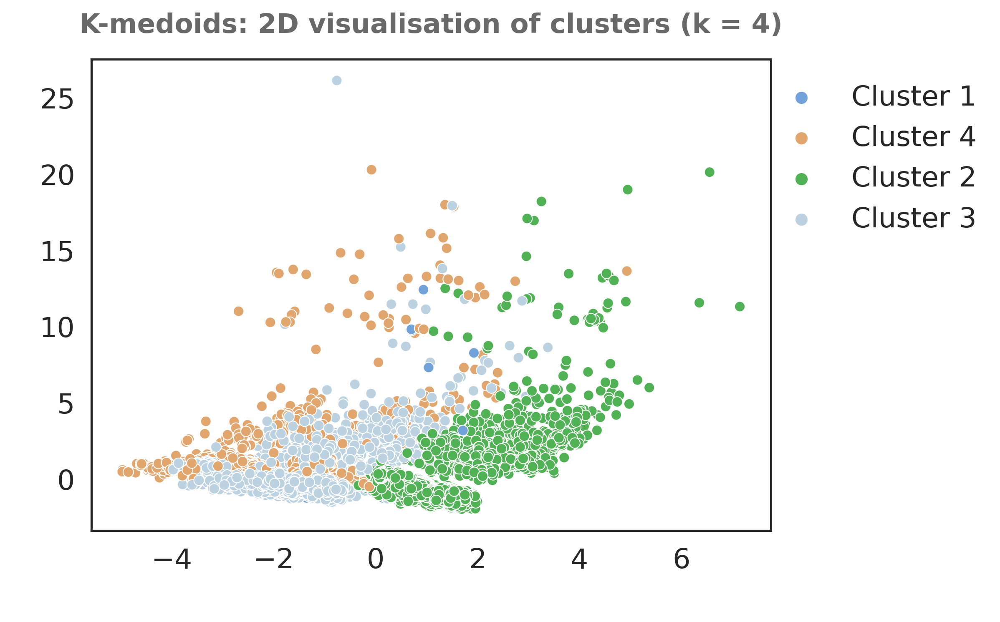

In [103]:
# Visualise the clusters formed with K-medoids (k=4)

df_pca = df_pca.sort_values(by=['Segment K-medoids'])
df_pca['Segment K-medoids'] = 'Cluster ' + df_pca['Segment K-medoids'].astype(str)

plt.figure(figsize=(7, 4.99), dpi=300)
colors = ["#71A3DA", "#E1A66E","#51B155", '#BDD2E1']
sns.set(style = 'white')

ax = sns.scatterplot(x = "Component 1", y = "Component 2",data =df_pca, 
                 hue = 'Segment K-medoids', palette=colors, legend='full')

#Set labels, title, legend, axis parameters
ax.set_xlabel("X ", fontsize = 17, color = 'white')
ax.set_ylabel(' ')
ax.set_title('K-medoids: 2D visualisation of clusters (k = 4)', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 15.5, y=1.05)

plt.tick_params(axis = 'both', which = 'major', labelsize = 16)
ax.legend(fontsize = 16, loc = 'upper right',bbox_to_anchor= (1.34, 1), frameon = False)

plt.savefig('images/2D_kmedoids_4.png', bbox_inches='tight')


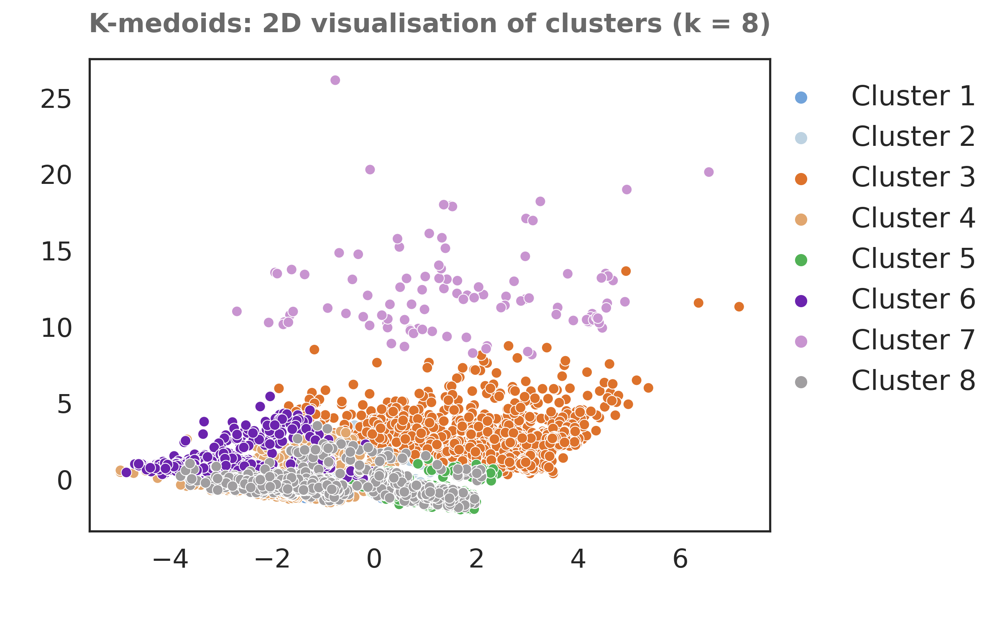

In [107]:
# Visualise the clusters formed with K-medoids (k=8)

df_pca = df_pca.sort_values(by=['Segment K-medoids B'])
df_pca['Segment K-medoids B'] = 'Cluster ' + df_pca['Segment K-medoids B'].astype(str)

plt.figure(figsize=(7, 4.99), dpi=300)
colors = ["#71A3DA", "#BDD2E1","#DD722B", '#E1A66E','#51B155',"#6B23AE","#C894D0","#A09EA0"]
sns.set(style = 'white')

ax = sns.scatterplot(x = "Component 1", y = "Component 2",data =df_pca, 
                 hue = 'Segment K-medoids B', palette=colors, legend='full')


#Set labels, title, legend, axis parameters
ax.set_xlabel("X ", fontsize = 17, color = 'white')
ax.set_ylabel(' ')
ax.set_title('K-medoids: 2D visualisation of clusters (k = 8)', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 15, y=1.05)

plt.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax.legend(fontsize = 16, loc = 'upper right',bbox_to_anchor= (1.34, 1), frameon = False)

plt.savefig('images/2D_kmedoids_8.png', bbox_inches='tight')


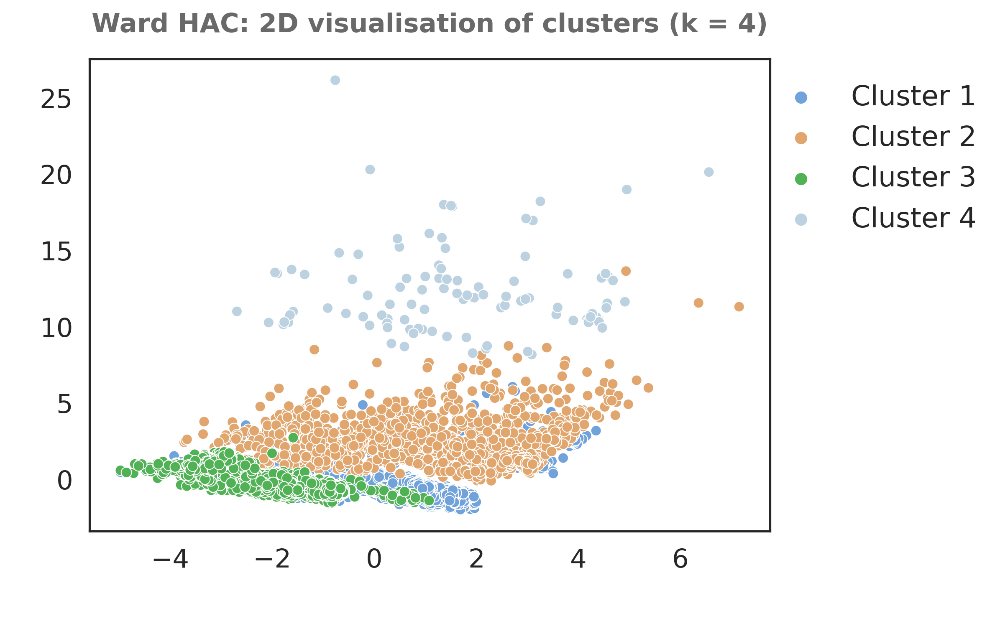

In [109]:
# Visualise the clusters formed with Ward HAC

df_pca = df_pca.sort_values(by=['Segment Ward'])
df_pca['Segment Ward'] = 'Cluster ' + df_pca['Segment Ward'].astype(str)

plt.figure(figsize=(7, 4.99), dpi=300)
colors = ["#71A3DA", "#E1A66E","#51B155",'#BDD2E1']
sns.set(style = 'white')

ax = sns.scatterplot(x = "Component 1", y = "Component 2",data =df_pca, 
                 hue = 'Segment Ward', palette=colors, legend='full')


#Set labels, title, legend, axis parameters
ax.set_xlabel("X ", fontsize = 17, color = 'white')
ax.set_ylabel(' ')
ax.set_title('Ward HAC: 2D visualisation of clusters (k = 4)', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 15, y=1.05)

plt.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax.legend(fontsize = 16, loc = 'upper right',bbox_to_anchor= (1.34, 1), frameon = False)

plt.savefig('images/2D_ward.png', bbox_inches='tight')


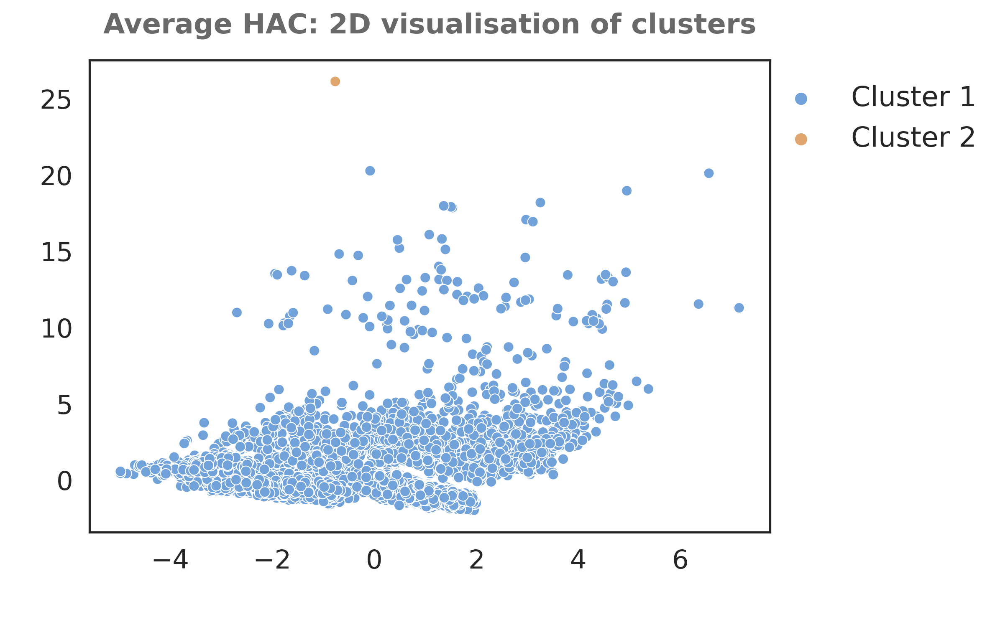

In [119]:
# Visualise the clusters formed with Avg HAC

df_pca = df_pca.sort_values(by=['Segment Avg'])
df_pca['Segment Avg'] = 'Cluster ' + df_pca['Segment Avg'].astype(str)

plt.figure(figsize=(7, 4.99), dpi=300)
colors = ["#71A3DA", "#E1A66E"]
sns.set(style = 'white')

ax = sns.scatterplot(x = "Component 1", y = "Component 2",data =df_pca, 
                 hue = 'Segment Avg', palette=colors, legend='full')


#Set labels, title, legend, axis parameters
ax.set_xlabel("X ", fontsize = 17, color = 'white')
ax.set_ylabel(' ')
ax.set_title('Average HAC: 2D visualisation of clusters', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 16, y=1.05)


plt.tick_params(axis = 'both', which = 'major', labelsize = 15)
ax.legend(fontsize = 16, loc = 'upper right',bbox_to_anchor= (1.34, 1), frameon = False)

plt.savefig('images/2D_avg.png', bbox_inches='tight')


#### 3D Visualisation

In [120]:
# We choose 3 components to visualise clusters in 3D
pca = PCA(n_components = 3)

#Fit the model the our data with the selected number of components. In our case three.
pca.fit(X_normalized)

scores_pca_3 = pca.transform(X_normalized)

In [121]:
#Transforming the array to a dataframe
df_pca_B = pd.DataFrame(data = scores_pca_3,
                      columns = ["Component 1",
                                 "Component 2",
                                "Component 3"])

#Calculatixng explained variance ratio per principal component
pca.explained_variance_ratio_.round(5)


array([0.1314 , 0.10154, 0.08446])

In [122]:
df_pca_B['Segment K-means'] = kmeans.labels_ + 1
df_pca_B['Segment K-medoids'] = kmedoids.labels_ + 1
df_pca_B['Segment K-medoids B'] = kmedoidsB.labels_ + 1
df_pca_B['Segment Ward'] = ward_agglomerative.labels_ + 1
df_pca_B['Segment Avg'] = avg_agglomerative.labels_ + 1


In [123]:
df_pca_B.head()

,Component 1,Component 2,Component 3,Segment K-means,Segment K-medoids,Segment K-medoids B,Segment Ward,Segment Avg
0,0.997159,-0.752967,-1.171012,4,2,5,1,1
1,-0.979708,-0.422091,-0.043180,2,3,4,3,1
2,-3.539734,0.995295,-0.027729,1,4,6,1,1
3,-1.700729,-0.607604,1.079688,2,3,4,3,1
4,2.686568,1.285508,-0.103736,3,2,3,2,1


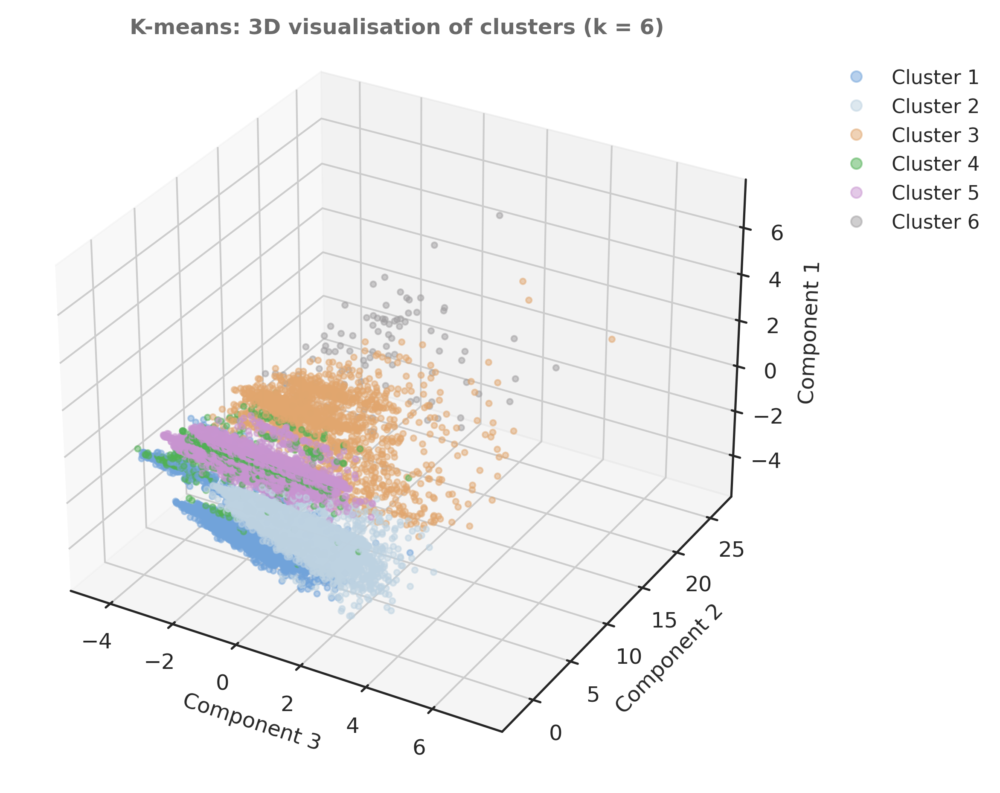

In [126]:
# Visualise the clusters formed with K-means

#axes instance
fig = plt.figure(figsize=(8,6), dpi =300)
ax = Axes3D(fig, auto_add_to_figure=False)
fig.add_axes(ax)
plt.tick_params(axis = 'both', which = 'major', labelsize = 12)

# get colormap from seaborn
colors = ["#71A3DA", "#BDD2E1","#DD722B", '#E1A66E','#51B155',"#6B23AE","#C894D0","#A09EA0"]
cmap = ListedColormap(sns.color_palette(colors, 8).as_hex())

# plot
sc = ax.scatter(df_pca_B['Component 3'], df_pca_B['Component 2'], df_pca_B['Component 1'], s=10, c=df_pca_B['Segment K-means'], marker='o', cmap=cmap, alpha=.5)
ax.set_xlabel('Component 3')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 1')

ax.set_title('K-means: 3D visualisation of clusters (k = 6)', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 12, y=1.05)

ax.legend(handles=sc.legend_elements()[0],labels = ['Cluster 1', 'Cluster 2', 'Cluster 3','Cluster 4', 'Cluster 5', 'Cluster 6'],bbox_to_anchor=(1.05, 0.95),loc=2, frameon = False)

plt.savefig('images/3D_kmeans.png', bbox_inches='tight')



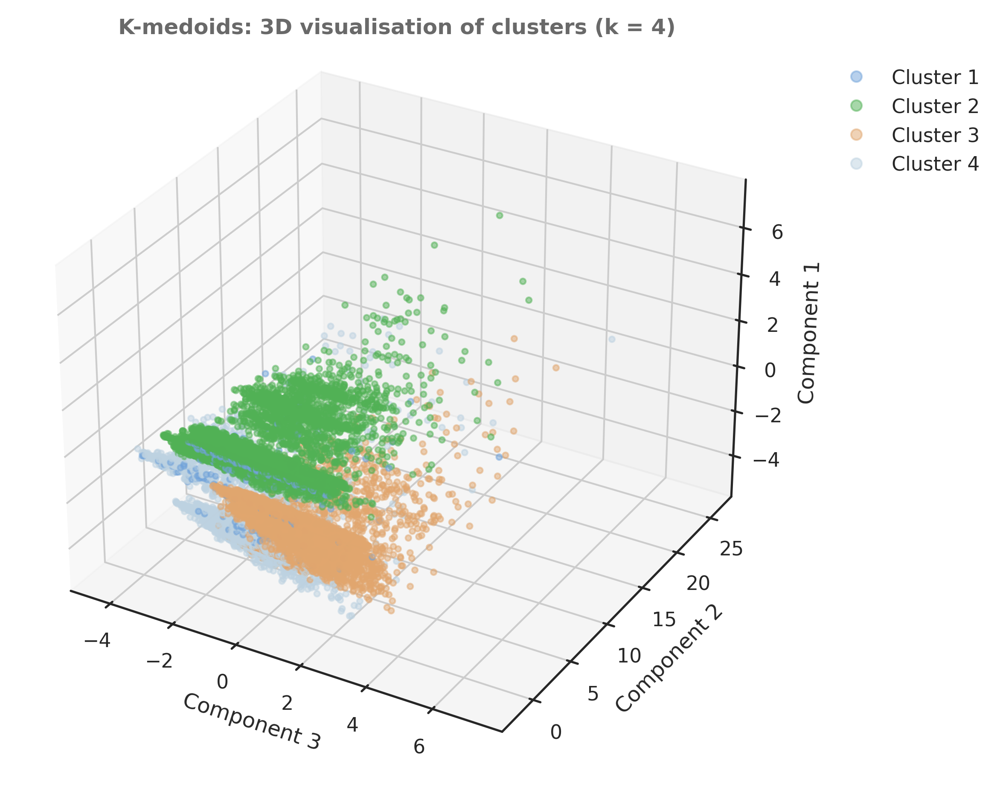

In [125]:
# Visualise the clusters formed with K-medoids (k=4)

#axes instance
fig = plt.figure(figsize=(6,6), dpi =300)
ax = Axes3D(fig, auto_add_to_figure=False)
fig.add_axes(ax)

# get colormap from seaborn
colors = ["#71A3DA", "#E1A66E","#51B155", '#BDD2E1']
cmap = ListedColormap(sns.color_palette(colors, 8).as_hex())

# plot
sc = ax.scatter(df_pca_B['Component 3'], df_pca_B['Component 2'], df_pca_B['Component 1'], s=10, c=df_pca_B['Segment K-medoids'], marker='o', cmap=cmap, alpha=.5)
ax.set_xlabel('Component 3')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 1')
ax.set_title('K-medoids: 3D visualisation of clusters (k = 4)', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 12, y=1.05)
ax.legend(handles=sc.legend_elements()[0],labels = ['Cluster 1', 'Cluster 2', 'Cluster 3','Cluster 4' ],bbox_to_anchor=(1.05, 0.95),loc=2, frameon = False)

plt.savefig('images/3D_kmedoids_4.png', bbox_inches='tight')


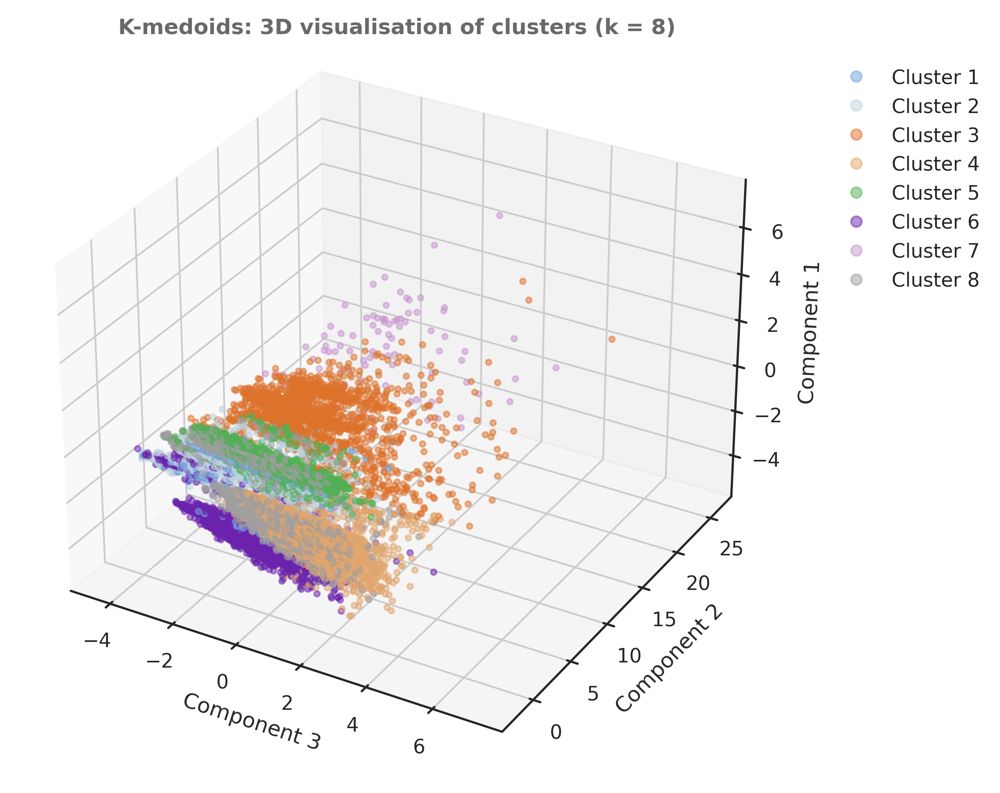

In [127]:
# Visualise the clusters formed with K-medoids (k=8)

#axes instance
fig = plt.figure(figsize=(6,6), dpi =300)
ax = Axes3D(fig, auto_add_to_figure=False)
fig.add_axes(ax)

# get colormap from seaborn
colors = ["#71A3DA", "#BDD2E1","#DD722B", '#E1A66E','#51B155',"#6B23AE","#C894D0","#A09EA0"]
cmap = ListedColormap(sns.color_palette(colors, 8).as_hex())

# plot
sc = ax.scatter(df_pca_B['Component 3'], df_pca_B['Component 2'], df_pca_B['Component 1'], s=10, c=df_pca_B['Segment K-medoids B'], marker='o', cmap=cmap, alpha=.5)
ax.set_xlabel('Component 3')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 1')
ax.set_title('K-medoids: 3D visualisation of clusters (k = 8)', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 12, y=1.05)
ax.legend(handles=sc.legend_elements()[0],labels = ['Cluster 1', 'Cluster 2', 'Cluster 3','Cluster 4', 'Cluster 5', 'Cluster 6','Cluster 7', 'Cluster 8'],bbox_to_anchor=(1.05, 0.95),loc=2, frameon = False)

plt.savefig('images/3D_kmedoids_8.png', bbox_inches='tight')


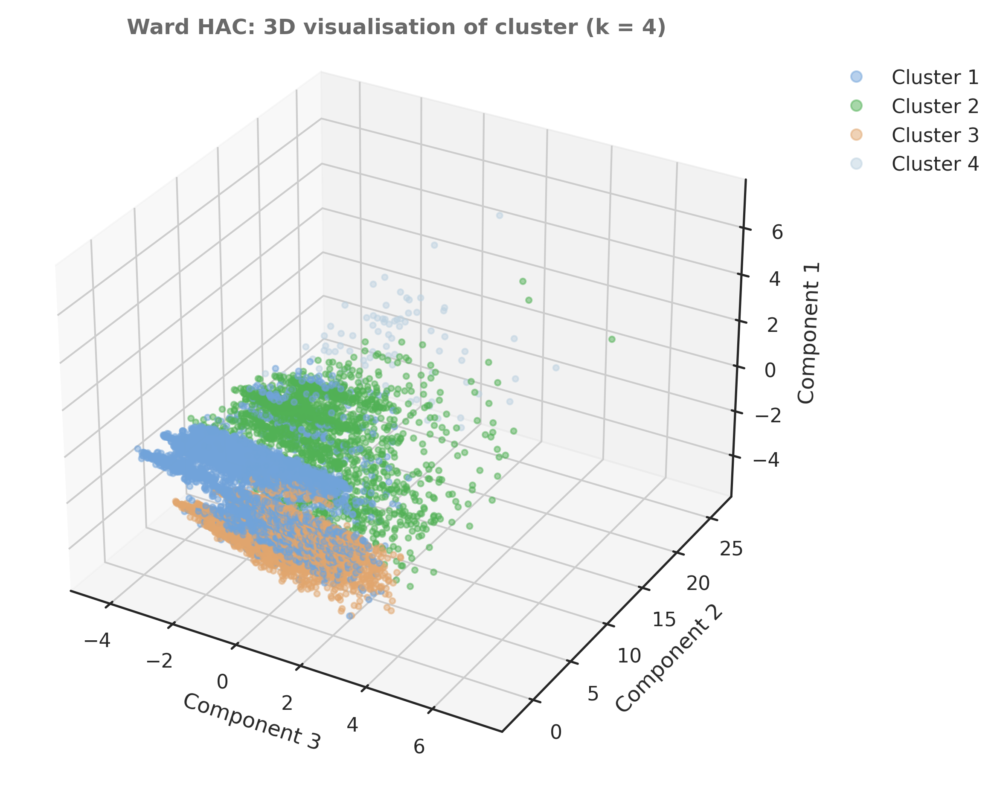

In [128]:
# Visualise the clusters formed with Ward HAC

#axes instance
fig = plt.figure(figsize=(6,6), dpi =300)
ax = Axes3D(fig, auto_add_to_figure=False)
fig.add_axes(ax)

# get colormap from seaborn
colors = ["#71A3DA", "#E1A66E","#51B155",'#BDD2E1']
cmap = ListedColormap(sns.color_palette(colors, 8).as_hex())

# plot
sc = ax.scatter(df_pca_B['Component 3'], df_pca_B['Component 2'], df_pca_B['Component 1'], s=10, c=df_pca_B['Segment Ward'], marker='o', cmap=cmap, alpha=.5)
ax.set_xlabel('Component 3')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 1')

ax.set_title('Ward HAC: 3D visualisation of cluster (k = 4)', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 12, y=1.05)
ax.legend(handles=sc.legend_elements()[0],labels = ['Cluster 1', 'Cluster 2', 'Cluster 3','Cluster 4' ],bbox_to_anchor=(1.05, 0.95),loc=2, frameon = False)

plt.savefig('images/3D_ward.png', bbox_inches='tight')


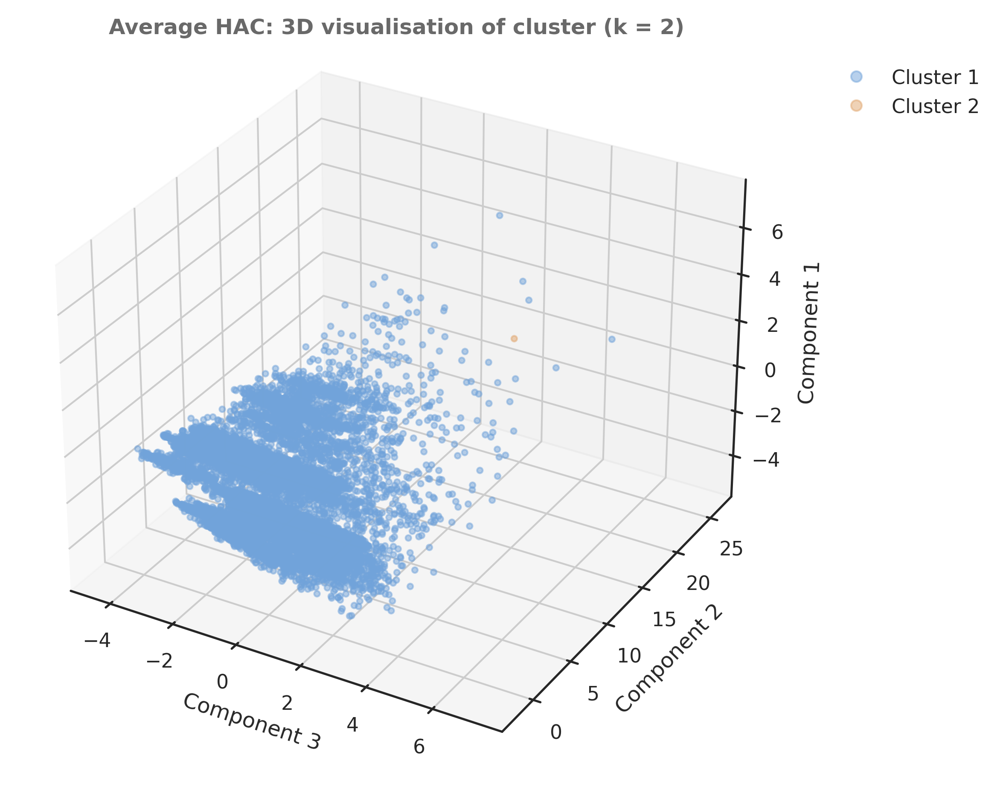

In [129]:
# Visualise the clusters formed with Avg HAC

#axes instance
fig = plt.figure(figsize=(6,6), dpi =300)
ax = Axes3D(fig, auto_add_to_figure=False)
fig.add_axes(ax)

# get colormap from seaborn
colors = ["#71A3DA", "#E1A66E"]
cmap = ListedColormap(sns.color_palette(colors, 8).as_hex())

# plot
sc = ax.scatter(df_pca_B['Component 3'], df_pca_B['Component 2'], df_pca_B['Component 1'], s=10, c=df_pca_B['Segment Avg'], marker='o', cmap=cmap, alpha=.5)
ax.set_xlabel('Component 3')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 1')
ax.set_title('Average HAC: 3D visualisation of cluster (k = 2)', color = "#696969", va = "center", ha = "center",weight = "bold",
                     size = 12, y=1.05)
ax.legend(handles=sc.legend_elements()[0],labels = ['Cluster 1', 'Cluster 2' ],bbox_to_anchor=(1.05, 0.95),loc=2, frameon = False)

plt.savefig('images/3D_average.png', bbox_inches='tight')


## SAVE RESULTS: K-means 6 clusters (90 % Explained Variance)

In [325]:
#Add the cluster labels to the original dataset
kmeans = KMeans(n_clusters=6, init = 'k-means++', random_state = 33).fit(scores_pca_90)
X['Segment K-means'] = kmeans.labels_
X.groupby(['Segment K-means']).mean()

,start_hour,day,weekend,device,traffic_source,pages_viewed,session_duration,avg_page_duration,home_pct,search_pct,advice_pct,info_pct,product_pct,category_pct,sale_pct,unique_category_pct,unique_product_pct,cart_total_value,cart_total_product_quantity,is_cart_empty,is_logged_on,is_in_UK,previous_total_interactions,is_return_visitor,is_purchase,revenue_generated
Segment K-means,,,,,,,,,,,,,,,,,,,,,,,,,,
0,14.444552,2.722276,0.222758,1.196721,1.006268,2.784474,84.852476,30.715637,17.744180,16.950108,2.443002,0.651375,0.240276,61.971059,1.316297,77.665886,0.666988,6.871061,0.051591,0.950820,0.024590,0.966731,0.0,0.0,0.002893,0.095448
1,14.684965,2.715337,0.235239,0.953216,0.829843,3.505188,143.446245,43.111590,1.746189,3.146778,0.344387,0.447624,42.500741,51.814280,3.432686,95.729692,98.742645,0.388221,0.011319,0.988870,0.017544,0.973967,0.0,0.0,0.000755,0.051805
2,14.504767,2.757415,0.220339,1.224047,0.896186,2.289725,94.956539,45.554250,3.503960,11.106739,0.413640,1.097786,73.998247,9.879628,4.591278,19.818150,94.722180,231.680567,1.277542,0.000000,0.195975,0.980403,0.0,0.0,0.091102,10.134338
3,14.308028,2.847295,0.239965,1.222513,0.828970,2.144852,105.964051,49.669970,4.331006,1.199825,0.261780,51.004945,41.852821,1.349622,5.900233,3.141361,84.904014,5.414677,0.068935,0.936300,0.025305,0.965096,0.0,0.0,0.002618,0.165611
4,14.702913,2.746889,0.229214,1.253394,0.830600,2.338235,98.509028,43.284406,4.032132,12.825900,1.550952,0.043835,81.547181,0.000000,4.770591,0.000000,98.708488,0.000000,0.000000,1.000000,0.018241,0.978083,0.0,0.0,0.000000,0.000000
5,12.894231,2.826923,0.269231,1.259615,0.846154,2.913462,95.282926,35.678337,21.900183,14.249084,3.605769,9.056777,39.120879,12.067308,3.076923,24.038462,56.913919,94.897981,0.701923,0.442308,1.000000,0.980769,1.5,1.0,0.038462,2.537885


In [326]:
X.to_csv("df_with_cluster_labels.csv")